# Programming Exercise 1: Linear Regression

## Introduction

In this exercise, you will implement linear regression and get to see it work on data. Before starting on this programming exercise, we strongly recommend watching the video lectures and completing the review questions for the associated topics.

All the information you need for solving this assignment is in this notebook, and all the code you will be implementing will take place within this notebook. The assignment can be promptly submitted to the coursera grader directly from this notebook (code and instructions are included below).

Before we begin with the exercises, we need to import all libraries required for this programming exercise. Throughout the course, we will be using [`numpy`](http://www.numpy.org/) for all arrays and matrix operations, and [`matplotlib`](https://matplotlib.org/) for plotting.

You can find instructions on how to install required libraries in the README file in the [github repository](https://github.com/dibgerge/ml-coursera-python-assignments).

In [1]:
import os

# Scientific and vector computation for python
import numpy as np

# Plotting library
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D  # needed to plot 3-D surfaces

# tells matplotlib to embed plots within the notebook
%matplotlib inline

## Debugging

Here are some things to keep in mind throughout this exercise:

- Python array indices start from zero, not one (contrary to OCTAVE/MATLAB). 

- There is an important distinction between python arrays (called `list` or `tuple`) and `numpy` arrays. You should use `numpy` arrays in all your computations. Vector/matrix operations work only with `numpy` arrays. Python lists do not support vector operations (you need to use for loops).

- If you are seeing many errors at runtime, inspect your matrix operations to make sure that you are adding and multiplying matrices of compatible dimensions. Printing the dimensions of `numpy` arrays using the `shape` property will help you debug.

- By default, `numpy` interprets math operators to be element-wise operators. If you want to do matrix multiplication, you need to use the `dot` function in `numpy`. For, example if `A` and `B` are two `numpy` matrices, then the matrix operation AB is `np.dot(A, B)`. Note that for 2-dimensional matrices or vectors (1-dimensional), this is also equivalent to `A@B` (requires python >= 3.5).

<a id="section1"></a>
## 1 Simple python and `numpy` function

The first part of this assignment gives you practice with python and `numpy` syntax and the homework submission process. In the next cell, you will find the outline of a `python` function. Modify it to return a 5 x 5 identity matrix by filling in the following code:

```python
A = np.eye(5)
```
<a id="warmUpExercise"></a>

In [2]:
def warmUpExercise():
    """
    Example function in Python which computes the identity matrix.
    
    Returns
    -------
    A : array_like
        The 5x5 identity matrix.
    
    Instructions
    ------------
    Return the 5x5 identity matrix.
    """    
    # ======== YOUR CODE HERE ======
    A = np.eye(5)   # modify this line
    
    # ==============================
    return A

The previous cell only defines the function `warmUpExercise`. We can now run it by executing the following cell to see its output. You should see output similar to the following:

```python
array([[ 1.,  0.,  0.,  0.,  0.],
       [ 0.,  1.,  0.,  0.,  0.],
       [ 0.,  0.,  1.,  0.,  0.],
       [ 0.,  0.,  0.,  1.,  0.],
       [ 0.,  0.,  0.,  0.,  1.]])
```

In [3]:
warmUpExercise()

array([[1., 0., 0., 0., 0.],
       [0., 1., 0., 0., 0.],
       [0., 0., 1., 0., 0.],
       [0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 1.]])

## 2 Linear regression with one variable

Now you will implement linear regression with one variable to predict profits for a food truck. Suppose you are the CEO of a restaurant franchise and are considering different cities for opening a new outlet. The chain already has trucks in various cities and you have data for profits and populations from the cities. You would like to use this data to help you select which city to expand to next. 

The file `Data/ex1data1.txt` contains the dataset for our linear regression problem. The first column is the population of a city (in 10,000s) and the second column is the profit of a food truck in that city (in $10,000s). A negative value for profit indicates a loss. 

We provide you with the code needed to load this data. The dataset is loaded from the data file into the variables `x` and `y`:

In [4]:
# Read comma separated data
data = np.loadtxt(os.path.join('ex1data1.txt'), delimiter=',')
X, y = data[:, 0], data[:, 1]

m = y.size  # number of training examples

### 2.1 Plotting the Data

Before starting on any task, it is often useful to understand the data by visualizing it. For this dataset, you can use a scatter plot to visualize the data, since it has only two properties to plot (profit and population). Many other problems that you will encounter in real life are multi-dimensional and cannot be plotted on a 2-d plot. There are many plotting libraries in python (see this [blog post](https://blog.modeanalytics.com/python-data-visualization-libraries/) for a good summary of the most popular ones). 

In this course, we will be exclusively using `matplotlib` to do all our plotting. `matplotlib` is one of the most popular scientific plotting libraries in python and has extensive tools and functions to make beautiful plots. `pyplot` is a module within `matplotlib` which provides a simplified interface to `matplotlib`'s most common plotting tasks, mimicking MATLAB's plotting interface.

<div class="alert alert-block alert-warning">
You might have noticed that we have imported the `pyplot` module at the beginning of this exercise using the command `from matplotlib import pyplot`. This is rather uncommon, and if you look at python code elsewhere or in the `matplotlib` tutorials, you will see that the module is named `plt`. This is used by module renaming by using the import command `import matplotlib.pyplot as plt`. We will not using the short name of `pyplot` module in this class exercises, but you should be aware of this deviation from norm.
</div>


In the following part, your first job is to complete the `plotData` function below. Modify the function and fill in the following code:

```python
    pyplot.plot(x, y, 'ro', ms=10, mec='k')
    pyplot.ylabel('Profit in $10,000')
    pyplot.xlabel('Population of City in 10,000s')
```

In [37]:
def plotData(x, y):
    """
    Plots the data points x and y into a new figure. Plots the data 
    points and gives the figure axes labels of population and profit.
    
    Parameters
    ----------
    x : array_like
        Data point values for x-axis.

    y : array_like
        Data point values for y-axis. Note x and y should have the same size.
    
    Instructions
    ------------
    Plot the training data into a figure using the "figure" and "plot"
    functions. Set the axes labels using the "xlabel" and "ylabel" functions.
    Assume the population and revenue data have been passed in as the x
    and y arguments of this function.    
    
    Hint
    ----
    You can use the 'ro' option with plot to have the markers
    appear as red circles. Furthermore, you can make the markers larger by
    using plot(..., 'ro', ms=10), where `ms` refers to marker size. You 
    can also set the marker edge color using the `mec` property.
    """
    
    # ====================== YOUR CODE HERE ======================= 
    plt.plot(x, y, 'ro', ms=10, mec='k',color = 'purple')
    plt.ylabel('Profit in $10,000')
    plt.xlabel('Population of City in 10,000s')
    
    
    # =============================================================


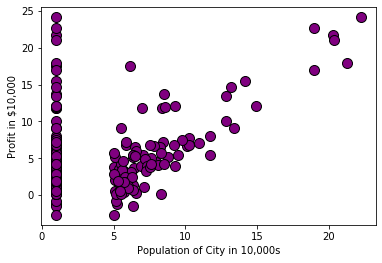

In [38]:
plotData(X, y)

To quickly learn more about the `matplotlib` plot function and what arguments you can provide to it, you can type `?pyplot.plot` in a cell within the jupyter notebook. This opens a separate page showing the documentation for the requested function. You can also search online for plotting documentation. 

To set the markers to red circles, we used the option `'or'` within the `plot` function.

<a id="section2"></a>
### 2.2 Gradient Descent

In this part, you will fit the linear regression parameters $\theta$ to our dataset using gradient descent.

#### 2.2.1 Update Equations

The objective of linear regression is to minimize the cost function

$$ J(\theta) = \frac{1}{2m} \sum_{i=1}^m \left( h_{\theta}(x^{(i)}) - y^{(i)}\right)^2$$

where the hypothesis $h_\theta(x)$ is given by the linear model
$$ h_\theta(x) = \theta^Tx = \theta_0 + \theta_1 x_1$$

Recall that the parameters of your model are the $\theta_j$ values. These are
the values you will adjust to minimize cost $J(\theta)$. One way to do this is to
use the batch gradient descent algorithm. In batch gradient descent, each
iteration performs the update

$$ \theta_j = \theta_j - \alpha \frac{1}{m} \sum_{i=1}^m \left( h_\theta(x^{(i)}) - y^{(i)}\right)x_j^{(i)} \qquad \text{simultaneously update } \theta_j \text{ for all } j$$

With each step of gradient descent, your parameters $\theta_j$ come closer to the optimal values that will achieve the lowest cost J($\theta$).

<div class="alert alert-block alert-warning">
**Implementation Note:** We store each example as a row in the the $X$ matrix in Python `numpy`. To take into account the intercept term ($\theta_0$), we add an additional first column to $X$ and set it to all ones. This allows us to treat $\theta_0$ as simply another 'feature'.
</div>


#### 2.2.2 Implementation

We have already set up the data for linear regression. In the following cell, we add another dimension to our data to accommodate the $\theta_0$ intercept term. Do NOT execute this cell more than once.

In [7]:
# Add a column of ones to X. The numpy function stack joins arrays along a given axis. 
# The first axis (axis=0) refers to rows (training examples) 
# and second axis (axis=1) refers to columns (features).

X = np.stack([np.ones(m), X], axis=1)

In [8]:
X

array([[ 1.    ,  6.1101],
       [ 1.    ,  5.5277],
       [ 1.    ,  8.5186],
       [ 1.    ,  7.0032],
       [ 1.    ,  5.8598],
       [ 1.    ,  8.3829],
       [ 1.    ,  7.4764],
       [ 1.    ,  8.5781],
       [ 1.    ,  6.4862],
       [ 1.    ,  5.0546],
       [ 1.    ,  5.7107],
       [ 1.    , 14.164 ],
       [ 1.    ,  5.734 ],
       [ 1.    ,  8.4084],
       [ 1.    ,  5.6407],
       [ 1.    ,  5.3794],
       [ 1.    ,  6.3654],
       [ 1.    ,  5.1301],
       [ 1.    ,  6.4296],
       [ 1.    ,  7.0708],
       [ 1.    ,  6.1891],
       [ 1.    , 20.27  ],
       [ 1.    ,  5.4901],
       [ 1.    ,  6.3261],
       [ 1.    ,  5.5649],
       [ 1.    , 18.945 ],
       [ 1.    , 12.828 ],
       [ 1.    , 10.957 ],
       [ 1.    , 13.176 ],
       [ 1.    , 22.203 ],
       [ 1.    ,  5.2524],
       [ 1.    ,  6.5894],
       [ 1.    ,  9.2482],
       [ 1.    ,  5.8918],
       [ 1.    ,  8.2111],
       [ 1.    ,  7.9334],
       [ 1.    ,  8.0959],
 

<a id="section2"></a>
#### 2.2.3 Computing the cost $J(\theta)$

As you perform gradient descent to learn minimize the cost function $J(\theta)$, it is helpful to monitor the convergence by computing the cost. In this section, you will implement a function to calculate $J(\theta)$ so you can check the convergence of your gradient descent implementation. 

Your next task is to complete the code for the function `computeCost` which computes $J(\theta)$. As you are doing this, remember that the variables $X$ and $y$ are not scalar values. $X$ is a matrix whose rows represent the examples from the training set and $y$ is a vector whose each elemennt represent the value at a given row of $X$.
<a id="computeCost"></a>

In [22]:
def computeCost(X, y, theta):
    """
    Compute cost for linear regression. Computes the cost of using theta as the
    parameter for linear regression to fit the data points in X and y.
    
    Parameters
    ----------
    X : array_like
        The input dataset of shape (m x n+1), where m is the number of examples,
        and n is the number of features. We assume a vector of one's already 
        appended to the features so we have n+1 columns.
    
    y : array_like
        The values of the function at each data point. This is a vector of
        shape (m, ).
    
    theta : array_like
        The parameters for the regression function. This is a vector of 
        shape (n+1, ).
    
    Returns
    -------
    J : float
        The value of the regression cost function.
    
    Instructions
    ------------
    Compute the cost of a particular choice of theta. 
    You should set J to the cost.
    """
    
    # initialize some useful values
    m = y.size  # number of training examples
    
    # You need to return the following variables correctly
    J = 0
    
    # ====================== YOUR CODE HERE =====================
   
    
    htheta=np.dot(X, theta)
    print(htheta)
    a = np.sum((htheta-y)**2)
    J=a/(2*m)
    # ===========================================================
    return J

Once you have completed the function, the next step will run `computeCost` two times using two different initializations of $\theta$. You will see the cost printed to the screen.

In [23]:
J = computeCost(X, y, theta=np.array([0.0, 0.0]))
print('With theta = [0, 0] \nCost computed = %.2f' % J)
print('Expected cost value (approximately) 32.07\n')

# further testing of the cost function
J = computeCost(X, y, theta=np.array([-1, 2]))
print('With theta = [-1, 2]\nCost computed = %.2f' % J)
print('Expected cost value (approximately) 54.24')

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0.]
With theta = [0, 0] 
Cost computed = 32.07
Expected cost value (approximately) 32.07

[11.2202 10.0554 16.0372 13.0064 10.7196 15.7658 13.9528 16.1562 11.9724
  9.1092 10.4214 27.328  10.468  15.8168 10.2814  9.7588 11.7308  9.2602
 11.8592 13.1416 11.3782 39.54    9.9802 11.6522 10.1298 36.89   24.656
 20.914  25.352  43.406   9.5048 12.1788 17.4964 10.7836 15.4222 14.8668
 15.1918 10.2126 24.672  11.7068  9.8138 12.765  22.416  10.5474 14.6494
 13.1862  9.1404 10.6028 22.4    10.0832 14.0804  9.6154 13.8478 14.2062
 11.6656 11.7178 11.5484 10.2794 17.6204 17.9072 16.6508  9.3586 41.558
 28.816  36.918  13.4364 15.5902 19.472   9.9988 39.682  19.272  13.669
 11.0124 13.4518  9.0538 12.0958 14.

*You should now submit your solutions by executing the following cell.*

<a id="section3"></a>
#### 2.2.4 Gradient descent

Next, you will complete a function which implements gradient descent.
The loop structure has been written for you, and you only need to supply the updates to $\theta$ within each iteration. 

As you program, make sure you understand what you are trying to optimize and what is being updated. Keep in mind that the cost $J(\theta)$ is parameterized by the vector $\theta$, not $X$ and $y$. That is, we minimize the value of $J(\theta)$ by changing the values of the vector $\theta$, not by changing $X$ or $y$. [Refer to the equations in this notebook](#section2) and to the video lectures if you are uncertain. A good way to verify that gradient descent is working correctly is to look at the value of $J(\theta)$ and check that it is decreasing with each step. 

The starter code for the function `gradientDescent` calls `computeCost` on every iteration and saves the cost to a `python` list. Assuming you have implemented gradient descent and `computeCost` correctly, your value of $J(\theta)$ should never increase, and should converge to a steady value by the end of the algorithm.

<div class="alert alert-box alert-warning">
**Vectors and matrices in `numpy`** - Important implementation notes

A vector in `numpy` is a one dimensional array, for example `np.array([1, 2, 3])` is a vector. A matrix in `numpy` is a two dimensional array, for example `np.array([[1, 2, 3], [4, 5, 6]])`. However, the following is still considered a matrix `np.array([[1, 2, 3]])` since it has two dimensions, even if it has a shape of 1x3 (which looks like a vector).

Given the above, the function `np.dot` which we will use for all matrix/vector multiplication has the following properties:
- It always performs inner products on vectors. If `x=np.array([1, 2, 3])`, then `np.dot(x, x)` is a scalar.
- For matrix-vector multiplication, so if $X$ is a $m\times n$ matrix and $y$ is a vector of length $m$, then the operation `np.dot(y, X)` considers $y$ as a $1 \times m$ vector. On the other hand, if $y$ is a vector of length $n$, then the operation `np.dot(X, y)` considers $y$ as a $n \times 1$ vector.
- A vector can be promoted to a matrix using `y[None]` or `[y[np.newaxis]`. That is, if `y = np.array([1, 2, 3])` is a vector of size 3, then `y[None, :]` is a matrix of shape $1 \times 3$. We can use `y[:, None]` to obtain a shape of $3 \times 1$.
<div>
<a id="gradientDescent"></a>

In [24]:
def gradientDescent(X, y, theta, alpha, num_iters):
    """
    Performs gradient descent to learn `theta`. Updates theta by taking `num_iters`
    gradient steps with learning rate `alpha`.
    
    Parameters
    ----------
    X : array_like
        The input dataset of shape (m x n+1).
    
    y : arra_like
        Value at given features. A vector of shape (m, ).
    
    theta : array_like
        Initial values for the linear regression parameters. 
        A vector of shape (n+1, ).
    
    alpha : float
        The learning rate.
    
    num_iters : int
        The number of iterations for gradient descent. 
    
    Returns
    -------
    theta : array_like
        The learned linear regression parameters. A vector of shape (n+1, ).
    
    J_history : list
        A python list for the values of the cost function after each iteration.
    
    Instructions
    ------------
    Peform a single gradient step on the parameter vector theta.

    While debugging, it can be useful to print out the values of 
    the cost function (computeCost) and gradient here.
    """
    # Initialize some useful values
    m = y.shape[0]  # number of training examples
    
    # make a copy of theta, to avoid changing the original array, since numpy arrays
    # are passed by reference to functions
    theta = theta.copy()
    
    J_history = [] # Use a python list to save cost in every iteration
    
    for i in range(num_iters):
        # ==================== YOUR CODE HERE =================================
        htheta=np.dot(X, theta)
        theta[0]=(theta[0])-((alpha/m)*np.sum((htheta-y)*X[:,0]))
        theta[1]=(theta[0])-((alpha/m)*np.sum((htheta-y)*X[:,1]))
        print(theta)
        # =====================================================================
        
        # save the cost J in every iteration
        J_history.append(computeCost(X, y, theta))
    
    return theta, J_history

After you are finished call the implemented `gradientDescent` function and print the computed $\theta$. We initialize the $\theta$ parameters to 0 and the learning rate $\alpha$ to 0.01. Execute the following cell to check your code.

In [40]:
# initialize fitting parameters
theta = np.zeros(2)

# some gradient descent settings
iterations = 1500
alpha = 0.01

theta, J_history = gradientDescent(X ,y, theta, alpha, iterations)
print('Theta found by gradient descent: {:.4f}, {:.4f}'.format(*theta))
print('Expected theta values (approximately): [-3.6303, 1.1664]')

[0.05839135 0.71167985]
[ 4.40682639  3.99234405  6.1209073   5.04242766  4.22869292  6.02433235
  5.37919457  6.16325225  4.67448918  3.65564831  4.12258146 10.13862472
  4.1391636   6.04248018  4.07276387  3.88680192  4.58851825  3.70938014
  4.6342081   5.09053722  4.4630491  14.48414187  3.96558488  4.56054924
  4.01881854 13.54116607  9.18782044  7.85626744  9.43548503 15.85981902
  3.79641858  4.74793454  6.64014892  4.25146668  5.90206575  5.70443226
  5.82008023  4.04828208  9.19351388  4.5799781   3.90637312  4.9565279
  8.39073901  4.16741729  5.62707266  5.10640768  3.66675052  4.18713082
  8.38504557  4.0022364   5.42459974  3.83577448  5.34183137  5.4693644
  4.56531749  4.58389234  4.52361305  4.07205219  6.68427307  6.78632796
  6.33925068  3.74439479 15.20222684 10.66811452 13.55112959  5.19543883
  5.96184686  7.34314627  3.97220351 14.53467114  7.27197829  5.2782072
  4.33288285  5.20091876  3.63593478  4.71839983  5.42346105  3.6427669
  7.37019011  3.69343851  4.135

[0.56511004 0.64623251]
[ 4.51365527  4.13728946  6.07010626  5.09080552  4.35190328  5.98241251
  5.39660274  6.10855709  4.75670332  3.83155686  4.25555001  9.71834725
  4.27060723  5.99889144  4.21031373  4.04145318  4.67863843  3.88034742
  4.72012656  5.13449084  4.56470764 13.66424292  4.11299112  4.65324149
  4.16132931 12.80798485  8.85498062  7.6458796   9.07986953 14.91341036
  3.95938165  4.82339451  6.5415975   4.37258272  5.87138977  5.691931
  5.79694378  4.18808334  8.86015048  4.67088364  4.05922457  5.01280526
  8.13120021  4.29626266  5.62168553  5.14890182  3.84163809  4.3141633
  8.12603035  4.14627209  5.43783238  3.99511831  5.36267554  5.4784804
  4.65757125  4.67443792  4.61970203  4.2096675   6.58166391  6.67433365
  6.26837039  3.91214206 14.31629152 10.19914423 12.81703211  5.22974551
  5.9256733   7.17994596  4.11900108 13.71012543  7.11532271  5.30490235
  4.44651171  5.2347215   3.81365622  4.79657586  5.43679841  3.81986005
  7.2045028   3.86587181  4.267

[0.56528857 0.64632038]
[ 4.51437073  4.13795374  6.07103336  5.09159946  4.35259673  5.98332769
  5.39743826  6.10948943  4.75745182  3.83217956  4.25623037  9.71977044
  4.27128963  5.99980886  4.21098794  4.04210442  4.67937632  3.88097675
  4.72087009  5.13529072  4.56543004 13.66620269  4.11365209  4.65397593
  4.16199685 12.80982818  8.85628641  7.64702098  9.0812059  14.91553998
  3.96002173  4.82415208  6.54258871  4.37327899  5.87228985  5.69280668
  5.79783374  4.18875452  8.86145698  4.67162047  4.05987823  5.01358859
  8.13240759  4.29694855  5.62255165  5.14970366  3.84226216  4.31485162
  8.12723702  4.14693759  5.4386735   3.99576325  5.36350644  5.47932705
  4.65830627  4.67517524  4.6204319   4.21034162  6.58266058  6.67534292
  6.26932446  3.91277571 14.31833995 10.2006328  12.81887667  5.23055834
  5.92658076  7.18102398  4.11966287 13.71209143  7.11639195  5.3057254
  4.44721804  5.23553501  3.81427649  4.79732979  5.43763939  3.82048116
  7.20558416  3.86649918  4.

[0.56528885 0.64632052]
[ 4.51437187  4.1379548   6.07103485  5.09160073  4.35259785  5.98332916
  5.3974396   6.10949092  4.75745302  3.83218056  4.25623146  9.71977273
  4.27129073  5.99981033  4.21098902  4.04210547  4.6793775   3.88097776
  4.72087128  5.135292    4.5654312  13.66620584  4.11365315  4.65397711
  4.16199793 12.80983114  8.85628851  7.64702281  9.08120805 14.9155434
  3.96002276  4.8241533   6.54259031  4.3732801   5.87229129  5.69280808
  5.79783517  4.1887556   8.86145907  4.67162166  4.05987928  5.01358985
  8.13240953  4.29694965  5.62255304  5.14970495  3.84226316  4.31485273
  8.12723896  4.14693866  5.43867485  3.99576429  5.36350778  5.47932841
  4.65830745  4.67517642  4.62043307  4.2103427   6.58266218  6.67534454
  6.26932599  3.91277673 14.31834324 10.2006352  12.81887963  5.23055965
  5.92658222  7.18102572  4.11966393 13.71209459  7.11639366  5.30572672
  4.44721917  5.23553631  3.81427749  4.797331    5.43764074  3.82048216
  7.2055859   3.86650018  4.

  4.0792689 ]
[0.56528885 0.64632052]
[ 4.51437188  4.1379548   6.07103485  5.09160074  4.35259785  5.98332916
  5.39743961  6.10949093  4.75745303  3.83218057  4.25623146  9.71977273
  4.27129073  5.99981033  4.21098902  4.04210547  4.67937751  3.88097776
  4.72087128  5.135292    4.5654312  13.66620584  4.11365315  4.65397711
  4.16199793 12.80983115  8.85628851  7.64702282  9.08120806 14.91554341
  3.96002276  4.8241533   6.54259031  4.37328011  5.87229129  5.69280809
  5.79783517  4.1887556   8.86145908  4.67162166  4.05987929  5.01358985
  8.13240953  4.29694965  5.62255304  5.14970495  3.84226317  4.31485273
  8.12723896  4.14693866  5.43867486  3.99576429  5.36350778  5.47932842
  4.65830746  4.67517642  4.62043307  4.2103427   6.58266218  6.67534454
  6.26932599  3.91277673 14.31834325 10.2006352  12.81887964  5.23055965
  5.92658222  7.18102572  4.11966393 13.7120946   7.11639367  5.30572672
  4.44721917  5.23553632  3.81427749  4.797331    5.43764074  3.82048216
  7.2055859  

[0.56528885 0.64632052]
[ 4.51437188  4.1379548   6.07103485  5.09160074  4.35259785  5.98332916
  5.39743961  6.10949093  4.75745303  3.83218057  4.25623146  9.71977273
  4.27129073  5.99981033  4.21098902  4.04210547  4.67937751  3.88097776
  4.72087128  5.135292    4.5654312  13.66620584  4.11365315  4.65397711
  4.16199793 12.80983115  8.85628851  7.64702282  9.08120806 14.91554341
  3.96002276  4.8241533   6.54259031  4.37328011  5.87229129  5.69280809
  5.79783517  4.1887556   8.86145908  4.67162166  4.05987929  5.01358985
  8.13240953  4.29694965  5.62255304  5.14970495  3.84226317  4.31485273
  8.12723896  4.14693866  5.43867486  3.99576429  5.36350778  5.47932842
  4.65830746  4.67517642  4.62043307  4.2103427   6.58266218  6.67534454
  6.26932599  3.91277673 14.31834325 10.2006352  12.81887964  5.23055965
  5.92658222  7.18102572  4.11966393 13.7120946   7.11639367  5.30572672
  4.44721917  5.23553632  3.81427749  4.797331    5.43764074  3.82048216
  7.2055859   3.86650019  4

  4.0792689 ]
[0.56528885 0.64632052]
[ 4.51437188  4.1379548   6.07103485  5.09160074  4.35259785  5.98332916
  5.39743961  6.10949093  4.75745303  3.83218057  4.25623146  9.71977273
  4.27129073  5.99981033  4.21098902  4.04210547  4.67937751  3.88097776
  4.72087128  5.135292    4.5654312  13.66620584  4.11365315  4.65397711
  4.16199793 12.80983115  8.85628851  7.64702282  9.08120806 14.91554341
  3.96002276  4.8241533   6.54259031  4.37328011  5.87229129  5.69280809
  5.79783517  4.1887556   8.86145908  4.67162166  4.05987929  5.01358985
  8.13240953  4.29694965  5.62255304  5.14970495  3.84226317  4.31485273
  8.12723896  4.14693866  5.43867486  3.99576429  5.36350778  5.47932842
  4.65830746  4.67517642  4.62043307  4.2103427   6.58266218  6.67534454
  6.26932599  3.91277673 14.31834325 10.2006352  12.81887964  5.23055965
  5.92658222  7.18102572  4.11966393 13.7120946   7.11639367  5.30572672
  4.44721917  5.23553632  3.81427749  4.797331    5.43764074  3.82048216
  7.2055859  

  4.0792689 ]
[0.56528885 0.64632052]
[ 4.51437188  4.1379548   6.07103485  5.09160074  4.35259785  5.98332916
  5.39743961  6.10949093  4.75745303  3.83218057  4.25623146  9.71977273
  4.27129073  5.99981033  4.21098902  4.04210547  4.67937751  3.88097776
  4.72087128  5.135292    4.5654312  13.66620584  4.11365315  4.65397711
  4.16199793 12.80983115  8.85628851  7.64702282  9.08120806 14.91554341
  3.96002276  4.8241533   6.54259031  4.37328011  5.87229129  5.69280809
  5.79783517  4.1887556   8.86145908  4.67162166  4.05987929  5.01358985
  8.13240953  4.29694965  5.62255304  5.14970495  3.84226317  4.31485273
  8.12723896  4.14693866  5.43867486  3.99576429  5.36350778  5.47932842
  4.65830746  4.67517642  4.62043307  4.2103427   6.58266218  6.67534454
  6.26932599  3.91277673 14.31834325 10.2006352  12.81887964  5.23055965
  5.92658222  7.18102572  4.11966393 13.7120946   7.11639367  5.30572672
  4.44721917  5.23553632  3.81427749  4.797331    5.43764074  3.82048216
  7.2055859  

  4.0792689 ]
[0.56528885 0.64632052]
[ 4.51437188  4.1379548   6.07103485  5.09160074  4.35259785  5.98332916
  5.39743961  6.10949093  4.75745303  3.83218057  4.25623146  9.71977273
  4.27129073  5.99981033  4.21098902  4.04210547  4.67937751  3.88097776
  4.72087128  5.135292    4.5654312  13.66620584  4.11365315  4.65397711
  4.16199793 12.80983115  8.85628851  7.64702282  9.08120806 14.91554341
  3.96002276  4.8241533   6.54259031  4.37328011  5.87229129  5.69280809
  5.79783517  4.1887556   8.86145908  4.67162166  4.05987929  5.01358985
  8.13240953  4.29694965  5.62255304  5.14970495  3.84226317  4.31485273
  8.12723896  4.14693866  5.43867486  3.99576429  5.36350778  5.47932842
  4.65830746  4.67517642  4.62043307  4.2103427   6.58266218  6.67534454
  6.26932599  3.91277673 14.31834325 10.2006352  12.81887964  5.23055965
  5.92658222  7.18102572  4.11966393 13.7120946   7.11639367  5.30572672
  4.44721917  5.23553632  3.81427749  4.797331    5.43764074  3.82048216
  7.2055859  

  4.0792689 ]
[0.56528885 0.64632052]
[ 4.51437188  4.1379548   6.07103485  5.09160074  4.35259785  5.98332916
  5.39743961  6.10949093  4.75745303  3.83218057  4.25623146  9.71977273
  4.27129073  5.99981033  4.21098902  4.04210547  4.67937751  3.88097776
  4.72087128  5.135292    4.5654312  13.66620584  4.11365315  4.65397711
  4.16199793 12.80983115  8.85628851  7.64702282  9.08120806 14.91554341
  3.96002276  4.8241533   6.54259031  4.37328011  5.87229129  5.69280809
  5.79783517  4.1887556   8.86145908  4.67162166  4.05987929  5.01358985
  8.13240953  4.29694965  5.62255304  5.14970495  3.84226317  4.31485273
  8.12723896  4.14693866  5.43867486  3.99576429  5.36350778  5.47932842
  4.65830746  4.67517642  4.62043307  4.2103427   6.58266218  6.67534454
  6.26932599  3.91277673 14.31834325 10.2006352  12.81887964  5.23055965
  5.92658222  7.18102572  4.11966393 13.7120946   7.11639367  5.30572672
  4.44721917  5.23553632  3.81427749  4.797331    5.43764074  3.82048216
  7.2055859  

  4.0792689 ]
[0.56528885 0.64632052]
[ 4.51437188  4.1379548   6.07103485  5.09160074  4.35259785  5.98332916
  5.39743961  6.10949093  4.75745303  3.83218057  4.25623146  9.71977273
  4.27129073  5.99981033  4.21098902  4.04210547  4.67937751  3.88097776
  4.72087128  5.135292    4.5654312  13.66620584  4.11365315  4.65397711
  4.16199793 12.80983115  8.85628851  7.64702282  9.08120806 14.91554341
  3.96002276  4.8241533   6.54259031  4.37328011  5.87229129  5.69280809
  5.79783517  4.1887556   8.86145908  4.67162166  4.05987929  5.01358985
  8.13240953  4.29694965  5.62255304  5.14970495  3.84226317  4.31485273
  8.12723896  4.14693866  5.43867486  3.99576429  5.36350778  5.47932842
  4.65830746  4.67517642  4.62043307  4.2103427   6.58266218  6.67534454
  6.26932599  3.91277673 14.31834325 10.2006352  12.81887964  5.23055965
  5.92658222  7.18102572  4.11966393 13.7120946   7.11639367  5.30572672
  4.44721917  5.23553632  3.81427749  4.797331    5.43764074  3.82048216
  7.2055859  

  4.0792689 ]
[0.56528885 0.64632052]
[ 4.51437188  4.1379548   6.07103485  5.09160074  4.35259785  5.98332916
  5.39743961  6.10949093  4.75745303  3.83218057  4.25623146  9.71977273
  4.27129073  5.99981033  4.21098902  4.04210547  4.67937751  3.88097776
  4.72087128  5.135292    4.5654312  13.66620584  4.11365315  4.65397711
  4.16199793 12.80983115  8.85628851  7.64702282  9.08120806 14.91554341
  3.96002276  4.8241533   6.54259031  4.37328011  5.87229129  5.69280809
  5.79783517  4.1887556   8.86145908  4.67162166  4.05987929  5.01358985
  8.13240953  4.29694965  5.62255304  5.14970495  3.84226317  4.31485273
  8.12723896  4.14693866  5.43867486  3.99576429  5.36350778  5.47932842
  4.65830746  4.67517642  4.62043307  4.2103427   6.58266218  6.67534454
  6.26932599  3.91277673 14.31834325 10.2006352  12.81887964  5.23055965
  5.92658222  7.18102572  4.11966393 13.7120946   7.11639367  5.30572672
  4.44721917  5.23553632  3.81427749  4.797331    5.43764074  3.82048216
  7.2055859  

[ 4.51437188  4.1379548   6.07103485  5.09160074  4.35259785  5.98332916
  5.39743961  6.10949093  4.75745303  3.83218057  4.25623146  9.71977273
  4.27129073  5.99981033  4.21098902  4.04210547  4.67937751  3.88097776
  4.72087128  5.135292    4.5654312  13.66620584  4.11365315  4.65397711
  4.16199793 12.80983115  8.85628851  7.64702282  9.08120806 14.91554341
  3.96002276  4.8241533   6.54259031  4.37328011  5.87229129  5.69280809
  5.79783517  4.1887556   8.86145908  4.67162166  4.05987929  5.01358985
  8.13240953  4.29694965  5.62255304  5.14970495  3.84226317  4.31485273
  8.12723896  4.14693866  5.43867486  3.99576429  5.36350778  5.47932842
  4.65830746  4.67517642  4.62043307  4.2103427   6.58266218  6.67534454
  6.26932599  3.91277673 14.31834325 10.2006352  12.81887964  5.23055965
  5.92658222  7.18102572  4.11966393 13.7120946   7.11639367  5.30572672
  4.44721917  5.23553632  3.81427749  4.797331    5.43764074  3.82048216
  7.2055859   3.86650019  4.26818839  3.91865825  4

We will use your final parameters to plot the linear fit.

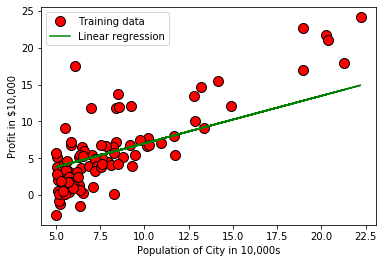

In [32]:
# plot the linear fit
plotData(X[:, 1], y)
plt.plot(X[:, 1], np.dot(X, theta), '-',color='green')
plt.legend(['Training data', 'Linear regression']);

Your final values for $\theta$ will also be used to make predictions on profits in areas of 35,000 and 70,000 people.

<div class="alert alert-block alert-success">
Note the way that the following lines use matrix multiplication, rather than explicit summation or looping, to calculate the predictions. This is an example of code vectorization in `numpy`.
</div>

<div class="alert alert-block alert-success">
Note that the first argument to the `numpy` function `dot` is a python list. `numpy` can internally converts **valid** python lists to numpy arrays when explicitly provided as arguments to `numpy` functions.
</div>


In [27]:
# Predict values for population sizes of 35,000 and 70,000
predict1 = np.dot([1, 3.5], theta)
print('For population = 35,000, we predict a profit of {:.2f}\n'.format(predict1*10000))

predict2 = np.dot([1, 7], theta)
print('For population = 70,000, we predict a profit of {:.2f}\n'.format(predict2*10000))

For population = 35,000, we predict a profit of 28274.11

For population = 70,000, we predict a profit of 50895.33



### 2.4 Visualizing $J(\theta)$

To understand the cost function $J(\theta)$ better, you will now plot the cost over a 2-dimensional grid of $\theta_0$ and $\theta_1$ values. You will not need to code anything new for this part, but you should understand how the code you have written already is creating these images.

In the next cell, the code is set up to calculate $J(\theta)$ over a grid of values using the `computeCost` function that you wrote. After executing the following cell, you will have a 2-D array of $J(\theta)$ values. Then, those values are used to produce surface and contour plots of $J(\theta)$ using the matplotlib `plot_surface` and `contourf` functions. 

The purpose of these graphs is to show you how $J(\theta)$ varies with changes in $\theta_0$ and $\theta_1$. The cost function $J(\theta)$ is bowl-shaped and has a global minimum. (This is easier to see in the contour plot than in the 3D surface plot). This minimum is the optimal point for $\theta_0$ and $\theta_1$, and each step of gradient descent moves closer to this point.

[-16.1101 -15.5277 -18.5186 -17.0032 -15.8598 -18.3829 -17.4764 -18.5781
 -16.4862 -15.0546 -15.7107 -24.164  -15.734  -18.4084 -15.6407 -15.3794
 -16.3654 -15.1301 -16.4296 -17.0708 -16.1891 -30.27   -15.4901 -16.3261
 -15.5649 -28.945  -22.828  -20.957  -23.176  -32.203  -15.2524 -16.5894
 -19.2482 -15.8918 -18.2111 -17.9334 -18.0959 -15.6063 -22.836  -16.3534
 -15.4069 -16.8825 -21.708  -15.7737 -17.8247 -17.0931 -15.0702 -15.8014
 -21.7    -15.5416 -17.5402 -15.3077 -17.4239 -17.6031 -16.3328 -16.3589
 -16.2742 -15.6397 -19.3102 -19.4536 -18.8254 -15.1793 -31.279  -24.908
 -28.959  -17.2182 -18.2951 -20.236  -15.4994 -30.341  -20.136  -17.3345
 -16.0062 -17.2259 -15.0269 -16.5479 -17.5386 -15.0365 -20.274  -15.1077
 -15.7292 -15.1884 -16.3557 -19.7687 -16.5159 -18.5172 -19.1802 -16.002
 -15.5204 -15.0594 -15.7077 -17.6366 -15.8707 -15.3054 -18.2934 -23.394
 -15.4369]
[-15.80150909 -15.24852323 -18.08836768 -16.64950303 -15.56385051
 -17.95952121 -17.09880404 -18.14486263 -16.158614

 -21.16258586 -14.41110707]
[-14.67371616 -14.20897273 -16.59565051 -15.38639192 -14.47398182
 -16.48736465 -15.76399596 -16.6431303  -14.97383636 -13.83144848
 -14.35500303 -21.10056566 -14.37359596 -16.50771313 -14.29914444
 -14.09063232 -14.8774404  -13.89169596 -14.92867071 -15.44033535
 -14.73675657 -25.9730303  -14.17896869 -14.8460798  -14.23865758
 -24.91570707 -20.03446465 -18.54144444 -20.31216162 -27.51552525
 -13.98928889 -15.05618788 -17.17785657 -14.49951717 -16.35027172
 -16.12867273 -16.25834444 -14.27169394 -20.04084848 -14.86786465
 -14.11257677 -15.29007576 -19.14072727 -14.40527576 -16.04193232
 -15.4581303  -13.84389697 -14.4273798  -19.13434343 -14.22006465
 -15.81490707 -14.03341717 -15.72210202 -15.8651     -14.85142626
 -14.87225354 -14.80466465 -14.29834646 -17.22733131 -17.34176162
 -16.84047071 -13.93095657 -26.77819192 -21.69426263 -24.92687879
 -15.55795758 -16.41730202 -17.96610101 -14.1863899  -26.02968687
 -17.88630303 -15.65076263 -14.59080606 -15.5641

 -15.54884848 -12.0123596 ]
[-12.00296869 -11.77353838 -12.95177172 -12.35479596 -11.90436566
 -12.89831414 -12.54120808 -12.97521111 -12.15112929 -11.58716566
 -11.84562929 -15.17571717 -11.85480808 -12.9083596  -11.81805354
 -11.71511717 -12.10354141 -11.61690808 -12.12883232 -12.38142626
 -12.0340899  -17.58111111 -11.75872626 -12.0880596  -11.78819293
 -17.05914141 -14.64941414 -13.91235354 -14.78650505 -18.34259596
 -11.66508687 -12.19178384 -13.2391899  -11.91697172 -12.83063535
 -12.72123838 -12.78525354 -11.80450202 -14.65256566 -12.09881414
 -11.72595051 -12.30724747 -14.20820202 -11.87044747 -12.67841717
 -12.39021111 -11.59331111 -11.8813596  -14.20505051 -11.77901414
 -12.56634141 -11.68687172 -12.52052626 -12.5911202  -12.09069899
 -12.10098081 -12.06761414 -11.8176596  -13.26361414 -13.32010505
 -13.07263232 -11.6362899  -17.97859596 -15.46880808 -17.06465657
 -12.43949293 -12.86372626 -13.62832323 -11.7623899  -17.60908081
 -13.58892929 -12.48530808 -11.96203838 -12.4425

 -5.76933939]
[-5.01194848 -5.42962929 -3.2846404  -4.37144242 -5.19145657 -3.38196061
 -4.03207677 -3.24196869 -4.7422202  -5.76892323 -5.29838687  0.76408081
 -5.28167677 -3.36367273 -5.34858889 -5.53598586 -4.82885455 -5.71477677
 -4.78281212 -4.32296162 -4.95529192  5.14313131 -5.45659495 -4.85703939
 -5.40295051  4.19287879 -0.19406061 -1.53588889  0.05551515  6.52942424
 -5.62706667 -4.66820808 -2.76139192 -5.16850707 -3.50517071 -3.70432929
 -3.58778889 -5.3732596  -0.18832323 -4.83746061 -5.51626364 -4.45800505
 -0.99729293 -5.25320505 -3.78228586 -4.30696869 -5.75773535 -5.23333939
 -1.0030303  -5.41966061 -3.98632121 -5.58740707 -4.06972828 -3.94121111
 -4.85223434 -4.83351616 -4.89426061 -5.34930606 -2.71692727 -2.61408485
 -3.06461212 -5.67949192  5.86675758  1.29765657  4.20291919 -4.21725051
 -3.44492828 -2.0529697  -5.44992525  5.19405051 -2.12468687 -4.13384343
 -5.08646263 -4.21172828 -5.78878889 -4.69797071 -3.98746869 -5.78190404
 -2.02571717 -5.73084141 -5.28511919 

  1.02286263]
[ 2.59625354  1.47263333  7.24295556  4.31930505  2.11335152  6.98115051
  5.23224646  7.35774848  3.32186061  0.55988485  1.82569394 18.13458586
  1.87064646  7.03034747  1.69064343  1.18651919  3.08880202  0.70554646
  3.21266263  4.44972525  2.74866768 29.91484848  1.40009192  3.01298081
  1.54440303 27.35853535 15.55705051 11.94734343 16.22844444 33.64417172
  0.94149899  3.52096364  8.65056768  2.17508889  6.64969798  6.11393333
  6.42744343  1.62427576 15.57248485  3.06565051  1.23957475  4.08643939
 13.39624242  1.94723939  5.90421919  4.49274848  0.58998182  2.00068081
 13.38080808  1.49945051  5.35533535  1.04818889  5.13095859  5.47668788
  3.02590707  3.07626162  2.91285051  1.68871414  8.77018384  9.04684444
  7.83486263  0.80046768 31.86150505 19.5699798  27.38554545  4.73410303
  6.81175859 10.55632323  1.41803434 30.05182828 10.36339394  4.9584798
  2.3958      4.74895859  0.50644343  3.44089798  5.35224848  0.52496465
 10.62963636  0.6623303   1.86138586  

  7.54047374]
[ 9.89586465  8.09571919 17.34031919 12.65635556  9.1222101  16.92088283
 14.11897374 17.52422828 11.05835556  6.6334101   8.66135556 34.78973737
  8.73337374 16.99970101  8.44499192  7.63733737 10.68497374  6.86677374
 10.8834101  12.86530101 10.14004646 53.66282828  7.97950101 10.56350101
  8.21070101 49.56737374 30.66028283 24.87719192 31.73591919 59.63755556
  7.24479192 11.37733737 19.59544646  9.22111919 16.38986465 15.53151919
 16.03379192  8.33866465 30.6850101  10.64788283  7.72233737 12.28328283
 27.19846465  8.85608283 15.19553737 12.93422828  6.68162828  8.94170101
 27.17373737  8.13868283 14.31617374  7.41571919 13.95670101 14.51059192
 10.5842101  10.66488283 10.40308283  8.44190101 19.78708283 20.23031919
 18.2886101   7.01884646 56.78155556 37.08937374 49.61064646 13.32090101
 16.64950101 22.64864646  8.00824646 53.88228283 22.33955556 13.68037374
  9.57471919 13.34470101  6.54779192 11.24906465 14.31122828  6.57746465
 22.76610101  6.79753737  8.71853737 

[ 8.5549303   6.90185556 15.39117778 11.08989091  7.84448283 15.00600909
 12.43301414 15.56006162  9.62244646  5.55901616  7.4212798  31.4149899
  7.48741414 15.07838788  7.22259293  6.48092323  9.2795697   5.77331414
  9.46179394 11.28176566  8.77916263 48.74616162  6.79513232  9.16802121
  7.00744343 44.98530303 27.62290909 22.31229293 28.61066667 54.23275758
  6.12044848  9.91536768 17.46206263  7.93531111 14.51837475 13.73015556
 14.19139293  7.12495253 27.64561616  9.24550909  6.55897879 10.74729798
 24.44391919  7.60009798 13.42162323 11.34506162  5.60329495  7.67872121
 24.42121212  6.94130909 12.61410303  6.27741111 12.28399899 12.79263737
  9.18703838  9.2611202   9.02070909  7.21975455 17.63804242 18.04506667
 16.26199394  5.91296263 51.61009091 33.52674747 45.0250404  11.70014343
 14.75679899 20.26581818  6.82152929 48.94768687 19.9819798  12.03024747
  8.26002222 11.72199899  5.48039293  9.79757475 12.60956162  5.50764141
 20.37367677  5.70973434  7.4737899   5.93879192  9.

 13.16174141]
[-14.49393838 -13.91153838 -16.90243838 -15.38703838 -14.24363838
 -16.76673838 -15.86023838 -16.96193838 -14.87003838 -13.43843838
 -14.09453838 -22.54783838 -14.11783838 -16.79223838 -14.02453838
 -13.76323838 -14.74923838 -13.51393838 -14.81343838 -15.45463838
 -14.57293838 -28.65383838 -13.87393838 -14.70993838 -13.94873838
 -27.32883838 -21.21183838 -19.34083838 -21.55983838 -30.58683838
 -13.63623838 -14.97323838 -17.63203838 -14.27563838 -16.59493838
 -16.31723838 -16.47973838 -13.99013838 -21.21983838 -14.73723838
 -13.79073838 -15.26633838 -20.09183838 -14.15753838 -16.20853838
 -15.47693838 -13.45403838 -14.18523838 -20.08383838 -13.92543838
 -15.92403838 -13.69153838 -15.80773838 -15.98693838 -14.71663838
 -14.74273838 -14.65803838 -14.02353838 -17.69403838 -17.83743838
 -17.20923838 -13.56313838 -29.66283838 -23.29183838 -27.34283838
 -15.60203838 -16.67893838 -18.61983838 -13.88323838 -28.72483838
 -18.51983838 -15.71833838 -14.39003838 -15.60973838 -13.41073

 -16.16410101 -11.42199091]
[-11.5146     -11.19692727 -12.82832727 -12.00174545 -11.37807273
 -12.75430909 -12.25985455 -12.86078182 -11.71974545 -10.93887273
 -11.29674545 -15.90763636 -11.30945455 -12.76821818 -11.25856364
 -11.11603636 -11.65385455 -10.98005455 -11.68887273 -12.03861818
 -11.55769091 -19.23818182 -11.17641818 -11.63241818 -11.21721818
 -18.51545455 -15.17890909 -14.15836364 -15.36872727 -20.29254545
 -11.04676364 -11.77603636 -13.22629091 -11.39552727 -12.6606
 -12.50912727 -12.59776364 -11.2398     -15.18327273 -11.64730909
 -11.13103636 -11.93590909 -14.568      -11.33110909 -12.44983636
 -12.05078182 -10.94738182 -11.34621818 -14.56363636 -11.20450909
 -12.29465455 -11.07692727 -12.23121818 -12.32896364 -11.63607273
 -11.65030909 -11.60410909 -11.25801818 -13.26010909 -13.33832727
 -12.99567273 -11.00689091 -19.78854545 -16.31345455 -18.52309091
 -12.11901818 -12.70641818 -13.76509091 -11.18149091 -19.27690909
 -13.71054545 -12.18245455 -11.45792727 -12.12321818

 -2.70765253]
[-1.74626162e+00 -2.34042727e+00  7.10894949e-01 -8.35119192e-01
 -2.00161818e+00  5.72453535e-01 -3.52359596e-01  7.71596970e-01
 -1.36256364e+00 -2.82308485e+00 -2.15373030e+00  6.47034343e+00
 -2.12995960e+00  5.98468687e-01 -2.22514444e+00 -2.49172323e+00
 -1.48580404e+00 -2.74605960e+00 -1.42030707e+00 -7.66153535e-01
 -1.66566566e+00  1.26996970e+01 -2.37878687e+00 -1.52589798e+00
 -2.30247576e+00  1.13479293e+01  5.10735354e+00  3.19855556e+00
  5.46238384e+00  1.46717475e+01 -2.62128889e+00 -1.25727879e+00
  1.45523434e+00 -1.96897172e+00  3.97182828e-01  1.13872727e-01
  2.79655556e-01 -2.26023939e+00  5.11551515e+00 -1.49804646e+00
 -2.46366768e+00 -9.58257576e-01  3.96472727e+00 -2.08945758e+00
  2.97676768e-03 -7.43403030e-01 -2.80716970e+00 -2.06119798e+00
  3.95656566e+00 -2.32624646e+00 -2.87270707e-01 -2.56487172e+00
 -4.05920202e-01 -2.23100000e-01 -1.51906263e+00 -1.49243535e+00
 -1.57884646e+00 -2.22616465e+00  1.51848687e+00  1.66478384e+00
  1.0238929

  2.98618586]
[ 4.62757677  3.44512828  9.51756162  6.4408404   4.11939192  9.24204949
  7.4015798   9.63836465  5.39117374  2.48459192  3.81667374 20.97943434
  3.8639798   9.29382222  3.67455253  3.14403434  5.14591313  2.6378798
  5.27625859  6.57808889  4.78797071 33.37646465  3.36878889  5.06612222
  3.52065556 30.68631313 18.26694949 14.46825253 18.97349495 37.3010404
  2.88618586  5.60070101 10.99887071  4.18436162  8.89324343  8.32942828
  8.65935253  3.6047101  18.28319192  5.12154949  3.19986768  6.19578283
 15.9930101   3.94458283  8.10873434  6.62336465  2.51626465  4.00082222
 15.97676768  3.47334949  7.53111313  2.99846162  7.29498889  7.65881919
  5.07972525  5.13271616  4.96074949  3.67252222 11.12474949 11.41589495
 10.14045859  2.73777071 35.4250404  22.4899798  30.71473737  6.87735556
  9.06378889 13.00440404  3.38767071 33.52061616 12.80137374  7.1134798
  4.41662828  6.89298889  2.42835253  5.51644343  7.52786465  2.44784343
 13.08155556  2.59240101  3.85423434  2.

  7.58166061]
[ 9.76705152  8.11397677 16.60329899 12.30201212  9.05660404 16.2181303
 13.64513535 16.77218283 10.83456768  6.77113737  8.63340101 32.62711111
  8.69953535 16.29050909  8.43471414  7.69304444 10.49169091  6.98543535
 10.67391515 12.49388687  9.99128384 49.95828283  8.00725354 10.38014242
  8.21956465 46.19742424 28.8350303  23.52441414 29.82278788 55.44487879
  7.3325697  11.12748889 18.67418384  9.14743232 15.73049596 14.94227677
 15.40351414  8.33707374 28.85773737 10.4576303   7.7711     11.95941919
 25.6560404   8.81221919 14.63374444 12.55718283  6.81541616  8.89084242
 25.63333333  8.1534303  13.82622424  7.48953232 13.4961202  14.00475859
 10.3991596  10.47324141 10.2328303   8.43187576 18.85016364 19.25718788
 17.47411515  7.12508384 52.82221212 34.73886869 46.23716162 12.91226465
 15.9689202  21.47793939  8.03365051 50.15980808 21.19410101 13.24236869
  9.47214343 12.9341202   6.69251414 11.00969596 13.82168283  6.71976263
 21.58579798  6.92185556  8.68591111  

 -12.44814141  -9.31352626]
[ -9.27013535  -9.07011919 -10.09729697  -9.57685657  -9.18417374
 -10.05069293  -9.7393697  -10.11773131  -9.39930101  -8.9076404
  -9.13296768 -12.03612121  -9.1409697  -10.05945051  -9.10892727
  -9.01918788  -9.35781414  -8.9335697   -9.37986263  -9.60007273
  -9.29726667 -14.13313131  -9.05720606  -9.34431717  -9.08289495
 -13.67808081 -11.57729293 -10.93472727 -11.69680808 -14.7969899
  -8.97557172  -9.43474343 -10.34786667  -9.19516364  -9.99169091
  -9.89631919  -9.95212727  -9.09711313 -11.5800404   -9.35369293
  -9.02863232  -9.53540404 -11.19264646  -9.15460404  -9.85898788
  -9.60773131  -8.91299798  -9.16411717 -11.18989899  -9.07489293
  -9.76128081  -8.99456364  -9.72133939  -9.78288283  -9.34661818
  -9.35558182  -9.32649293  -9.10858384 -10.3691596  -10.41840808
 -10.20266263  -8.95046667 -14.47965657 -12.29163636 -13.68288889
  -9.65069495 -10.02053939 -10.68711111  -9.0604     -14.15751515
 -10.65276768  -9.69063636  -9.23445253  -9.653339

  4.99175758e-01]
[ 1.73256667  0.90308788  5.16285455  3.00455758  1.37607879  4.96958485
  3.67850909  5.24759697  2.26822424  0.22927879  1.16372424 13.20327273
  1.19690909  5.00590303  1.06402727  0.69187273  2.09617576  0.33680909
  2.18761212  3.10083636  1.84508182 21.89969697  0.84953636  2.04020303
  0.9560697  20.01257576 11.30048485  8.63572727 11.79612121 24.65275758
  0.51099394  2.41520606  6.20198182  1.42165455  4.7249      4.32938788
  4.56082727  1.01503333 11.31187879  2.07908485  0.73103939  2.83265152
  9.70533333  1.25345152  4.17457273  3.13259697  0.25149697  1.29290303
  9.69393939  0.92288485  3.76937576  0.58975455  3.60373636  3.85896061
  2.04974545  2.08691818  1.96628485  1.06260303  6.29028485  6.49452121
  5.59981212  0.40688182 23.33675758 14.26290909 20.03251515  3.3107697
  4.84453636  7.60884848  0.86278182 22.00081818  7.46642424  3.47640909
  1.58458788  3.32173636  0.18982727  2.3561      3.76709697  0.2035
  7.6629697   0.30490606  1.19007273  

 13.33237778]
[16.12976869 13.94723939 25.15556162 19.47663838 15.19177576 24.64702929
 21.24994343 25.37853636 17.53919394 12.17430909 14.63302727 46.31155556
 14.72034343 24.7425899  14.37070404 13.39148889 17.08649899 12.45724343
 17.32708687 19.72996768 16.42581919 69.19363636 13.80633434 16.93922323
 14.08664545 64.22823232 41.30492929 34.29340404 42.60905051 76.43750505
 12.9155596  17.92593333 27.88971919 15.31169495 24.00321313 22.96253939
 23.57150404 14.24179091 41.33490909 17.04152929 13.49454444 19.02431818
 37.10775758 14.86911818 22.55518889 19.81353636 12.2327697  14.97292323
 37.07777778 13.99932929 21.48903232 13.12279495 21.05320101 21.72474848
 16.96433131 17.0621404  16.74472929 14.36695657 28.12206263 28.65945051
 26.30528687 12.64161919 72.97483838 49.09967677 64.28069697 20.28234545
 24.31800101 31.59147475 13.84118586 69.45970707 31.21672727 20.71817677
 15.74040606 20.31120101 12.07050404 17.77041313 21.48303636 12.1064798
 31.73387879 12.3733     14.70235556 1

 -5.75953636]
[-5.37614545 -5.47027071 -4.98689293 -5.23180606 -5.41659798 -5.00882424
 -5.15532929 -4.97727677 -5.31536162 -5.54673131 -5.44069495 -4.07450505
 -5.43692929 -5.00470303 -5.45200808 -5.49423838 -5.33488485 -5.53452929
 -5.32450909 -5.22088081 -5.36337778 -3.08767677 -5.47634747 -5.34123636
 -5.46425859 -3.30181818 -4.29042424 -4.59280808 -4.23418182 -2.77527273
 -5.51476364 -5.29868283 -4.86897778 -5.41142626 -5.0365899  -5.08147071
 -5.05520808 -5.45756768 -4.28913131 -5.33682424 -5.48979394 -5.25131313
 -4.47143434 -5.43051313 -5.09903838 -5.21727677 -5.5442101  -5.42603636
 -4.47272727 -5.46802424 -5.14501818 -5.50582626 -5.16381414 -5.13485253
 -5.34015354 -5.33593535 -5.34962424 -5.4521697  -4.85895758 -4.83578182
 -4.93730909 -5.52657778 -2.92460606 -3.95426263 -3.29955556 -5.19705859
 -5.02301414 -4.70933333 -5.47484444 -3.07620202 -4.72549495 -5.17826263
 -5.39293737 -5.19581414 -5.55120808 -5.3053899  -5.14527677 -5.54965657
 -4.70319192 -5.53814949 -5.43770505 

  1.03266566]
[ 2.23205657  1.43199192  5.54070303  3.45894141  1.8882101   5.35428687
  4.10899394  5.6224404   2.74871919  0.78207677  1.68338586 13.296
  1.71539394  5.38931717  1.58722424  1.22826667  2.58277172  0.88579394
  2.67096566  3.55180606  2.34058182 21.6840404   1.38033939  2.52878384
  1.48309495 19.86383838 11.46068687  8.89042424 11.93874747 24.33947475
  1.05380202  2.89048889  6.54298182  1.9321697   5.11827879  4.73679192
  4.96002424  1.53996768 11.47167677  2.56628687  1.26604444  3.29313131
  9.92210101  1.76993131  4.58746667  3.5824404   0.80350707  1.80798384
  9.91111111  1.45108687  4.19663838  1.1297697   4.03687273  4.28304646
  2.53798788  2.57384242  2.45748687  1.58585051  6.62815354  6.82514747
  5.96216566  0.95338182 23.07014141 14.31806061 19.88307071  3.75429495
  5.23367273  7.8999596   1.39311515 21.78157576  7.76258586  3.91406061
  2.08932525  3.76487273  0.74402424  2.83347879  4.1944404   0.75721212
  7.95216162  0.85502222  1.7088      0.96

  4.25518586]
[ 5.82857677  4.70495657 10.47527879  7.55162828  5.34567475 10.21347374
  8.4645697  10.59007172  6.55418384  3.79220808  5.05801717 21.36690909
  5.1029697  10.26267071  4.92296667  4.41884242  6.32112525  3.9378697
  6.44498586  7.68204848  5.98099091 33.14717172  4.63241515  6.24530404
  4.77672626 30.59085859 18.78937374 15.17966667 19.46076768 36.87649495
  4.17382222  6.75328687 11.88289091  5.40741212  9.88202121  9.34625657
  9.65976667  4.85659899 18.80480808  6.29797374  4.47189798  7.31876263
 16.62856566  5.17956263  9.13654242  7.72507172  3.82230505  5.23300404
 16.61313131  4.73177374  8.58765859  4.28051212  8.36328182  8.70901111
  6.2582303   6.30858485  6.14517374  4.92103737 12.00250707 12.27916768
 11.06718586  4.03279091 35.09382828 22.80230303 30.61786869  7.96642626
 10.04408182 13.78864646  4.65035758 33.28415152 13.59571717  8.19080303
  5.62812323  7.98128182  3.73876667  6.67322121  8.58457172  3.75728788
 13.8619596   3.89465354  5.09370909  

  7.47770606]
[ 9.42509697  7.97792121 15.40985455 11.64431515  8.80313939 15.07266061
 12.82014545 15.55770303 10.35964848  6.80233939  8.43264848 29.43781818
  8.49054545 15.13602424  8.25870909  7.60941818 10.05947879  6.98994545
 10.21900606 11.81229091  9.6214     44.61030303  7.88449091  9.96182424
  8.07035758 41.31787879 26.11806061 21.46890909 26.98278788 49.41351515
  7.29384242 10.61608485 17.2228      8.88265455 14.64576364 13.95572121
 14.35950909  8.1732303  26.13793939 10.02966061  7.67775152 11.34439394
 23.3350303   8.58919394 13.68561818 11.86770303  6.84110303  8.65802424
 23.31515152  8.01246061 12.97867879  7.43125455 12.68969091 13.13497576
  9.97847273 10.04332727  9.83286061  8.25622424 17.37686061 17.73318788
 16.17220606  7.1122     47.11751515 31.28654545 41.35266667 12.17855758
 14.85449091 19.67733333  7.9076     44.78672727 19.42884848 12.46754545
  9.16692121 12.19769091  6.73350909 10.51296364 12.97470303  6.75736364
 19.77175758  6.93428485  8.47861818 

 11.7985899 ]
[14.25598081 12.36759293 22.0653596  17.1517899  13.44440202 21.62536263
 18.68610505 22.25828384 15.47545657 10.83360202 12.96095657 40.37014141
 13.03650505 21.70804444 12.73398687 11.88674141 15.08377172 11.07840505
 15.29193535 17.37097778 14.51213232 60.16838384 12.24567778 14.95634444
 12.48821111 55.87217172 36.03826263 29.97168687 37.16662626 66.4359899
 11.47495354 15.81007475 24.43103232 13.5481596  21.06831414 20.16789293
 20.69478687 12.62244747 36.06420202 15.04486263 11.97590808 16.76042929
 32.40674747 13.16522929 19.81544141 17.44328384 10.88418384 13.25504444
 32.38080808 12.41266263 18.89297172 11.6542596  18.51587778 19.0969202
 14.97806869 15.06269596 14.78806263 12.73074444 24.63206263 25.09702626
 23.06013535 11.23793232 63.4399899  42.78250505 55.91756566 17.84891111
 21.34067778 27.63389899 12.27583232 60.39859596 27.30965657 18.22600505
 13.91909293 17.87387778 10.74378687 15.67551414 18.88778384 10.77491414
 27.75711111 11.00577475 13.02094141 11

  6.50879192]
[ 8.28618283  6.98607778 13.66273333 10.27987071  7.72743232 13.35980707
 11.33620606 13.79555657  9.1257596   5.92996566  7.39459293 26.26509091
  7.44660606 13.41673131  7.2383303   6.65502424  8.85609495  6.09850606
  8.9994101  10.43077576  8.46253636 39.89565657  6.90214242  8.76836465
  7.0691202  36.93782828 23.28270707 19.1060303  24.05955556 44.21073737
  6.37151919  9.35613535 15.29143636  7.79886667 12.97629394 12.35637778
 12.7191303   7.16153838 23.30056566  8.82930707  6.71641313 10.01042929
 20.78250505  7.53522929 12.11372424 10.48055657  5.9647899   7.59706465
 20.76464646  7.01710707 11.47862828  6.49496667 11.21900909 11.61904141
  8.78332121  8.84158485  8.65250707  7.23609798 15.4298404  15.74995556
 14.3476101   6.20833636 42.14807071 27.92593939 36.96908081 10.7598202
 13.16380909 17.49652525  6.92290303 40.05415152 17.27329293 11.01943939
  8.05424444 10.77700909  5.8681303   9.26349394 11.47505657  5.88956061
 17.58135354  6.04850202  7.43589091  

 12.2026303 ]
[14.66002121 12.77163333 22.4694     17.5558303  13.84844242 22.02940303
 19.09014545 22.66232424 15.87949697 11.23764242 13.36499697 40.77418182
 13.44054545 22.11208485 13.13802727 12.29078182 15.48781212 11.48244545
 15.69597576 17.77501818 14.91617273 60.57242424 12.64971818 15.36038485
 12.89225152 56.27621212 36.44230303 30.37572727 37.57066667 66.8400303
 11.87899394 16.21411515 24.83507273 13.9522     21.47235455 20.57193333
 21.09882727 13.02648788 36.46824242 15.44890303 12.37994848 17.1644697
 32.81078788 13.5692697  20.21948182 17.84732424 11.28822424 13.65908485
 32.78484848 12.81670303 19.29701212 12.0583     18.91991818 19.50096061
 15.38210909 15.46673636 15.19210303 13.13478485 25.03610303 25.50106667
 23.46417576 11.64197273 63.8440303  43.18654545 56.32160606 18.25295152
 21.74471818 28.03793939 12.67987273 60.80263636 27.71369697 18.63004545
 14.32313333 18.27791818 11.14782727 16.07955455 19.29182424 11.17895455
 28.16115152 11.40981515 13.42498182 11

 -2.99102020e-01]
[ 0.56028889  0.05436566  2.65252121  1.33611313  0.34285657  2.5346404
  1.74717576  2.70420808  0.88700202 -0.3566101   0.21333535  7.55660606
  0.23357576  2.55679192  0.15252727 -0.07446061  0.78206465 -0.29102424
  0.83783434  1.39483636  0.62891515 12.86080808  0.02170303  0.74792525
  0.08668081 11.70979798  6.3960404   4.77072727  6.69834343 14.5399798
 -0.18478384  0.97665051  3.28631515  0.37065455  2.3854      2.14416566
  2.28532727  0.12264444  6.4029899   0.7716404  -0.05057172  1.23126263
  5.42311111  0.26806263  2.04973939  1.41420808 -0.34305859  0.29212525
  5.41616162  0.0664404   1.80259798 -0.13674545  1.7015697   1.85723838
  0.75374545  0.77641818  0.7028404   0.15165859  3.34017374  3.46474343
  2.91903434 -0.24828485 13.73731313  8.20290909 11.7219596   1.52288081
  2.4583697   4.14440404  0.02978182 12.92248485  4.05753535  1.62390909
  0.47003232  1.5295697  -0.38067273  0.9406      1.80120808 -0.37233333
  4.17741414 -0.31048283  0.2294060

  9.23900909]
[11.2544      9.74839596 17.4824404  13.5638303  10.6071596  17.13153939
 14.78745859 17.63629899 12.22694141  8.52502626 10.22160808 32.08064646
 10.28185859 17.19747879 10.04059798  9.36491313 11.9145697   8.72025859
 12.08058182 13.73863434 11.45868283 47.86989899  9.65116768 11.81294545
  9.8445899  44.44363636 28.62593939 23.78779798 29.52581818 52.86836364
  9.03650909 12.49380202 19.36908283 10.68990707 16.68728889 15.96919596
 16.38939798  9.95164444 28.64662626 11.88353939  9.43602424 13.25171717
 25.72977778 10.38451717 15.68811313 13.79629899  8.56536566 10.45614545
 25.70909091  9.78433939 14.95243636  9.17950707 14.65170101 15.11508687
 11.83027071 11.89776162 11.67873939 10.03801212 19.52940606 19.90021818
 18.27578182  8.84748283 50.4790303  34.00452525 44.47983838 14.1197899
 16.90450101 21.92339394  9.67521616 48.05349495 21.66480808 14.42052525
 10.98572929 14.13970101  8.45339798 12.38648889 14.94829899  8.47822222
 22.02165657  8.66233535 10.26944646  

 14.10907475]
[16.70246566 14.69642121 24.9984101  19.77869899 15.84032121 24.53099899
 21.4086101  25.20335455 17.99792121 13.06685455 15.32675455 44.44367677
 15.4070101  24.61883232 15.08564343 14.1856101  17.58183232 13.3269101
 17.80296566 20.01154343 16.97457677 65.47545455 14.5669101  17.44646566
 14.82455455 60.91156566 39.84189899 33.39734343 41.04056566 72.13356566
 13.74816566 18.35338788 27.51147677 15.95054343 23.93924343 22.98272121
 23.54244343 14.96715455 39.86945455 17.54049899 14.28033232 19.36295455
 35.98412121 15.54375455 22.6083101  20.08835455 13.12058788 15.63916566
 35.95656566 14.74429899 21.62836566 13.93864343 21.22777677 21.84502121
 17.46954343 17.55944343 17.26769899 15.08219899 27.72503232 28.21896566
 26.05516566 13.49637677 68.95089899 47.00634343 60.95978788 20.51925455
 24.22857677 30.91389899 14.59894343 65.7200101  30.56945455 20.91984343
 16.34458788 20.54577677 12.97144343 18.21044343 21.62285455 13.0045101
 31.04478788 13.24975455 15.39047677 13

 -11.24521212  -6.90497576]
[ -6.96358485  -6.67532626  -8.15567071  -7.40562424  -6.83969899
  -8.08850606  -7.63983434  -8.1851202   -7.14973535  -6.44116566
  -6.76590202 -10.94985859  -6.77743434  -8.10112727  -6.73125556
  -6.60192525  -7.08994545  -6.47853434  -7.12172121  -7.43908283
  -7.00268586 -13.9720202   -6.65671616  -7.07049394  -6.69373838
 -13.31621212 -10.28860606  -9.36255556 -10.46084848 -14.92875758
  -6.53906667  -7.20081414  -8.51678586  -6.85553737  -8.00347374
  -7.86602626  -7.94645556  -6.71422929 -10.29256566  -7.08400606
  -6.61553636  -7.34588384  -9.73426263  -6.79708384  -7.81222525
  -7.4501202   -6.44888687  -6.81079394  -9.73030303  -6.68220606
  -7.67141212  -6.56643737  -7.61384949  -7.70254444  -7.0738101
  -7.08672828  -7.04480606  -6.73076061  -8.54747273  -8.61844848
  -8.30752121  -6.50288586 -14.47142424 -11.31810101 -13.32314141
  -7.51203838  -8.04504949  -9.00569697  -6.66131919 -14.00716162
  -8.95620202  -7.56960101  -6.9121596   -7.51584

 -3.95704646]
[-3.67565556 -3.68153838 -3.65132727 -3.66663434 -3.67818384 -3.65269798
 -3.66185455 -3.65072626 -3.67185657 -3.68631717 -3.6796899  -3.59430303
 -3.67945455 -3.6524404  -3.68039697 -3.68303636 -3.67307677 -3.68555455
 -3.67242828 -3.66595152 -3.67485758 -3.53262626 -3.68191818 -3.67347374
 -3.68116263 -3.5460101  -3.60779798 -3.62669697 -3.60428283 -3.51310101
 -3.68431919 -3.67081414 -3.64395758 -3.67786061 -3.65443333 -3.65723838
 -3.65559697 -3.68074444 -3.60771717 -3.67319798 -3.68275859 -3.66785354
 -3.61911111 -3.67905354 -3.65833636 -3.66572626 -3.6861596  -3.67877374
 -3.61919192 -3.68139798 -3.6612101  -3.68376061 -3.66238485 -3.66057475
 -3.67340606 -3.67314242 -3.67399798 -3.68040707 -3.64333131 -3.64188283
 -3.64822828 -3.68505758 -3.52243434 -3.58678788 -3.54586869 -3.66446263
 -3.65358485 -3.6339798  -3.68182424 -3.53190909 -3.6349899  -3.66328788
 -3.67670505 -3.66438485 -3.68659697 -3.67123333 -3.66122626 -3.6865
 -3.63359596 -3.68578081 -3.67950303 -3.6

  8.87615556]
[10.72154646  9.36261313 16.3413798  12.80544646 10.13751313 16.02474646
 13.9095798  16.48021313 11.59911313  8.25871313  9.78961313 29.5139798
  9.8439798  16.08424646  9.6262798   9.0165798  11.31724646  8.4348798
 11.46704646 12.9631798  10.9058798  43.76131313  9.2748798  11.22554646
  9.44941313 40.66964646 26.39664646 22.0309798  27.20864646 48.27164646
  8.72024646 11.83991313 18.0437798  10.2121798  15.6238798  14.97591313
 15.3550798   9.54601313 26.41531313 11.28924646  9.08074646 12.52381313
 23.78331313  9.93661313 14.7222798  13.01521313  8.29511313 10.00124646
 23.76464646  9.39504646 14.05844646  8.8492798  13.7870798  14.20521313
 11.2411798  11.3020798  11.10444646  9.62394646 18.18844646 18.52304646
 17.05724646  8.5496798  46.11564646 31.2499798  40.70231313 13.30711313
 15.8198798  20.34864646  9.2965798  43.9269798  20.11531313 13.5784798
 10.47911313 13.3250798   8.1940798  11.7430798  14.05471313  8.2164798
 20.43731313  8.38261313  9.8327798   8.5

  -9.08420202  -5.54771313]
[ -5.53832222  -5.30889192  -6.48712525  -5.89014949  -5.43971919
  -6.43366768  -6.07656162  -6.51056465  -5.68648283  -5.12251919
  -5.38098283  -8.71107071  -5.39016162  -6.44371313  -5.35340707
  -5.25047071  -5.63889495  -5.15226162  -5.66418586  -5.9167798
  -5.56944343 -11.11646465  -5.2940798   -5.62341313  -5.32354646
 -10.59449495  -8.18476768  -7.44770707  -8.32185859 -11.87794949
  -5.2004404   -5.72713737  -6.77454343  -5.45232525  -6.36598889
  -6.25659192  -6.32060707  -5.33985556  -8.18791919  -5.63416768
  -5.26130404  -5.84260101  -7.74355556  -5.40580101  -6.21377071
  -5.92556465  -5.12866465  -5.41671313  -7.74040404  -5.31436768
  -6.10169495  -5.22222525  -6.0558798   -6.12647374  -5.62605253
  -5.63633434  -5.60296768  -5.35301313  -6.79896768  -6.85545859
  -6.60798586  -5.17164343 -11.51394949  -9.00416162 -10.6000101
  -5.97484646  -6.3990798   -7.16367677  -5.29774343 -11.14443434
  -7.12428283  -6.02066162  -5.49739192  -5.977879

  5.91253434]
[ 7.31592525  6.33937576 11.3544202   8.81344646  6.8962303  11.12688283
  9.60689293 11.45418788  7.94655758  5.54609697  6.64622424 20.82044444
  6.68529293 11.1696404   6.52885051  6.09071111  7.74400404  5.67269293
  7.85165253  8.92679596  7.4483899  31.05878788  6.27632929  7.67810707
  6.40175152 28.83707071 18.58028283 15.44305051 19.16379798 34.2999798
  5.87776162  8.1196     12.5777899   6.94988687 10.83881414 10.37317576
 10.64565051  6.4711697  18.59369697  7.72388283  6.13682222  8.61106061
 16.70230303  6.75186061 10.19091111  8.96418788  5.57225455  6.79830707
 16.68888889  6.36268283  9.71387071  5.97048687  9.51886263  9.81933939
  7.68934141  7.73310505  7.59108283  6.52717374 12.68174949 12.92219798
 11.86885253  5.7551899  32.75064646 22.0679596  28.86054545  9.17395152
 10.97966263 14.23410101  6.29192323 31.17783838 14.06642424  9.3689596
  7.14170909  9.18686263  5.49965051  8.05001414  9.71118788  5.51574747
 14.29781818  5.63513333  6.67724444  5

 17.64737273]
[20.47876364 18.2668202  29.62619798 23.87073939 19.52812929 29.11081212
 25.66794343 29.85217778 21.90718384 16.46999596 18.96185051 51.06731313
 19.05034343 29.20766061 18.69599192 17.7035798  21.44838788 16.75674343
 21.69221818 24.12748283 20.77880404 74.25777778 18.12401616 21.29912727
 18.40810505 69.22545455 45.99321212 38.88719192 47.31490909 81.59927273
 17.22123636 22.29913535 32.39720404 19.64966465 28.45831919 27.4036202
 28.02079192 18.56534141 46.02359596 21.40281212 17.80802424 23.41232323
 41.73947475 19.20112323 26.9907798  24.21217778 16.52924444 19.30632727
 41.70909091 18.31961212 25.91025455 17.43126465 25.46854949 26.14914747
 21.32457374 21.42370101 21.10201212 18.69219394 32.63267879 33.17730909
 30.79141818 16.94360404 78.08993939 53.8930101  69.27862626 24.68730505
 28.77734949 36.14884848 18.15933737 74.52743434 35.76905051 25.1290101
 20.08415354 24.71654949 16.36479192 22.14151919 25.90417778 16.40125253
 36.29317172 16.67166869 19.03211313 16

 -7.15868687e-02]
[0.51580404 0.24519394 1.63490505 0.9307798  0.39950303 1.57185253
 1.15065051 1.66255152 0.69055758 0.0253697  0.33022424 4.2580202
 0.34105051 1.58370101 0.29769899 0.17628687 0.63442828 0.06045051
 0.66425859 0.9621899  0.55251111 7.09515152 0.22772323 0.61616768
 0.26247879 6.47949495 3.63725253 2.76789899 3.79894949 7.99331313
 0.11727677 0.73850909 1.97391111 0.41437172 1.49202626 1.36299394
 1.43849899 0.28171515 3.6409697  0.62885253 0.18906465 0.87469697
 3.11684848 0.35949697 1.31248687 0.97255152 0.03261818 0.37236768
 3.11313131 0.25165253 1.18029495 0.14297172 1.12625657 1.20952121
 0.61928081 0.63140808 0.59205253 0.29723434 2.00271919 2.06934949
 1.77745859 0.08331111 7.5639798  4.60371717 6.486      1.03067879
 1.53105657 2.43288889 0.23204444 7.12814141 2.38642424 1.08471717
 0.46752727 1.03425657 0.01249899 0.71922626 1.17955152 0.0169596
 2.45054545 0.05004242 0.3388202  0.08753939 0.62992121 2.2157596
 0.70435758 1.63425455 1.94231515 0.46557576 0.

  9.46652424]
[11.20991515  9.93922424 16.46482424 13.15849697 10.66380606 16.16875152
 14.19093333 16.59464242 12.03049697  8.90700606 10.33849697 28.78206061
 10.38933333 16.22438788 10.1857697   9.61566061 11.76693333  9.07173333
 11.90700606 13.30598788 11.38227879 42.10424242  9.85718788 11.68118788
 10.02038788 39.21333333 25.86715152 21.7849697  26.62642424 46.32169697
  9.3385697  12.25566061 18.05667879 10.73362424 15.79391515 15.18802424
 15.5425697  10.11071515 25.88460606 11.74075152  9.67566061 12.89515152
 23.42351515 10.47595152 14.95086061 13.35464242  8.94104242 10.53638788
 23.40606061  9.96955152 14.33013333  9.45922424 14.07638788 14.4673697
 11.69580606 11.75275152 11.56795152 10.18358788 18.19195152 18.50482424
 17.13420606  9.17907879 44.30569697 30.40533333 39.24387879 13.62758788
 15.97718788 20.21187879  9.87747879 42.25915152 19.99369697 13.88133333
 10.98322424 13.64438788  8.8465697  12.16511515 14.32664242  8.86751515
 20.29478788  9.02286061 10.37886061  

 19.55381717]
[22.52120808 20.19160808 32.15520808 26.09360808 21.52000808 31.61240808
 27.98640808 32.39320808 24.02560808 18.29920808 20.92360808 54.73680808
 21.01680808 31.71440808 20.64360808 19.59840808 23.54240808 18.60120808
 23.79920808 26.36400808 22.83720808 79.16080808 20.04120808 23.38520808
 20.34040808 73.86080808 49.39280808 41.90880808 50.78480808 86.89280808
 19.09040808 24.43840808 35.07360808 21.64800808 30.92520808 29.81440808
 30.46440808 20.50600808 49.42480808 23.49440808 19.70840808 25.61080808
 44.91280808 21.17560808 29.37960808 26.45320808 18.36160808 21.28640808
 44.88080808 20.24720808 28.24160808 19.31160808 27.77640808 28.49320808
 23.41200808 23.51640808 23.17760808 20.63960808 35.32160808 35.89520808
 33.38240808 18.79800808 83.19680808 57.71280808 73.91680808 26.95360808
 31.26120808 39.02480808 20.07840808 79.44480808 38.62480808 27.41880808
 22.10560808 26.98440808 18.18840808 24.27240808 28.23520808 18.22680808
 39.17680808 18.51160808 20.99760808 

  -8.8209697   -4.48073333]
[ -4.53934242  -4.25108384  -5.73142828  -4.98138182  -4.41545657
  -5.66426364  -5.21559192  -5.76087778  -4.72549293  -4.01692323
  -4.3416596   -8.52561616  -4.35319192  -5.67688485  -4.30701313
  -4.17768283  -4.66570303  -4.05429192  -4.69747879  -5.0148404
  -4.57844343 -11.54777778  -4.23247374  -4.64625152  -4.26949596
 -10.8919697   -7.86436364  -6.93831313  -8.03660606 -12.50451515
  -4.11482424  -4.77657172  -6.09254343  -4.43129495  -5.57923131
  -5.44178384  -5.52221313  -4.28998687  -7.86832323  -4.65976364
  -4.19129394  -4.92164141  -7.3100202   -4.37284141  -5.38798283
  -5.02587778  -4.02464444  -4.38655152  -7.30606061  -4.25796364
  -5.2471697   -4.14219495  -5.18960707  -5.27830202  -4.64956768
  -4.66248586  -4.62056364  -4.30651818  -6.1232303   -6.19420606
  -5.88327879  -4.07864343 -12.04718182  -8.89385859 -10.89889899
  -5.08779596  -5.62080707  -6.58145455  -4.23707677 -11.58291919
  -6.5319596   -5.14535859  -4.48791717  -5.09160

[ -5.57168586  -5.16577071  -7.25033737  -6.19414949  -5.39723434
  -7.15575859  -6.52395556  -7.29180707  -5.83381616  -4.83603434
  -5.29331616 -11.1850101   -5.30955556  -7.17353131  -5.24452828
  -5.0624101   -5.74962222  -4.88865556  -5.79436768  -6.24126465
  -5.62674646 -15.44070707  -5.13956465  -5.72223131  -5.19169798
 -14.51722222 -10.25385859  -8.94982828 -10.49640404 -16.78794949
  -4.97389495  -5.90574343  -7.75884646  -5.41953737  -7.03601919
  -6.84247071  -6.95572828  -5.22055253 -10.25943434  -5.74125859
  -5.08157677  -6.11002525  -9.47325253  -5.33722525  -6.7667101
  -6.25680707  -4.84690707  -5.35653131  -9.46767677  -5.17545859
  -6.56842222  -5.01243737  -6.48736465  -6.61226162  -5.72690101
  -5.74509192  -5.68605859  -5.24383131  -7.80205859  -7.90200404
  -7.46416768  -4.92294646 -16.14394949 -11.70355556 -14.5269798
  -6.34399798  -7.09456465  -8.44731313  -5.14604646 -15.49019192
  -8.37761616  -6.42505556  -5.49927071  -6.34936465  -4.81672828
  -5.8768191

  3.61185253]
[ 4.50524343  3.96990606  6.71911717  5.32617374  4.2751697   6.59438283
  5.76113535  6.77380909  4.85095152  3.53503636  4.13811818 11.90832323
  4.15953535  6.61782222  4.07377475  3.8335899   4.73991313  3.60443535
  4.79892525  5.38831111  4.5778596  17.52090909  3.93534444  4.70378889
  4.0041     16.3029798  10.68028283  8.96047475 11.00016162 19.29770707
  3.71685253  4.94581212  7.3897596   4.30458384  6.43646566  6.18120606
  6.33057475  4.04215455 10.68763636  4.72888283  3.85886768  5.21522727
  9.65078788  4.19602727  6.0812899   5.40880909  3.54937576  4.22148889
  9.64343434  3.98268283  5.8197798   3.76768384  5.71287778  5.87759697
  4.70994747  4.73393838  4.65608283  4.07285556  7.44674949  7.57856162
  7.00112525  3.6496596  18.44837374 12.59220202 16.31584848  5.5238
  6.51367778  8.29773737  3.94389293 17.58617172  8.20581818  5.63070202
  4.40973939  5.53087778  3.50957475  4.90766566  5.81830909  3.51839899
  8.33266667  3.58384545  4.15512323  3.6

  9.30569091]
[10.87908182  9.75546162 15.52578384 12.60213333 10.3961798  15.26397879
 13.51507475 15.64057677 11.60468889  8.84271313 10.10852222 26.41741414
 10.15347475 15.31317576  9.97347172  9.46934747 11.3716303   8.98837475
 11.49549091 12.73255354 11.03149596 38.19767677  9.6829202  11.29580909
  9.82723131 35.64136364 23.83987879 20.23017172 24.51127273 41.927
  9.22432727 11.80379192 16.93339596 10.45791717 14.93252626 14.39676162
 14.71027172  9.90710404 23.85531313 11.34847879  9.52240303 12.36926768
 21.67907071 10.23006768 14.18704747 12.77557677  8.8728101  10.28350909
 21.66363636  9.78227879 13.63816364  9.33101717 13.41378687 13.75951616
 11.30873535 11.3590899  11.19567879  9.97154242 17.05301212 17.32967273
 16.11769091  9.08329596 40.14433333 27.85280808 35.66837374 13.01693131
 15.09458687 18.83915152  9.70086263 38.33465657 18.64622222 13.24130808
 10.67862828 13.03178687  8.78927172 11.72372626 13.63507677  8.80779293
 18.91246465  8.94515859 10.14421414  9.10

 16.09789293]
[18.48728384 16.65772424 26.0533798  21.29288081 17.70098788 25.6270899
 22.77939798 26.24029394 19.6687697  15.17152121 17.23260303 43.78791919
 17.30579798 25.70719596 17.01270404 16.19185253 19.28928687 15.40869798
 19.49096566 21.5052404  18.73545556 62.96939394 16.53960707 19.16582929
 16.77458485 58.8070202  39.5909899  33.71340404 40.68420202 69.04174747
 15.79289293 19.99296364 28.34535556 17.80151313 25.08739495 24.21502424
 24.72550404 16.90463939 39.61612121 19.2515899  16.27824141 20.91371212
 36.07260606 17.43051212 23.87355253 21.57529394 15.22052727 17.51752929
 36.04747475 16.7013899  22.9798202  15.96661313 22.61447374 23.17741515
 19.18687677 19.26886768 19.0027899  17.00956263 28.54012323 28.99060202
 27.01716566 15.56325556 66.13908081 46.12513131 58.851      21.96828485
 25.35127374 31.44844444 16.56882222 63.19243434 31.13430303 22.33363131
 18.16089091 21.99247374 15.08450404 19.86259495 22.97479394 15.11466162
 31.56781818 15.3383303  17.29071919 1

  -9.63824242  -4.09238485]
[ -4.25299394  -3.87649293  -5.81000404  -4.83035152  -4.09118384
  -5.72227879  -5.13625859  -5.84846869  -4.49612929  -3.57065051
  -3.99479596  -9.45955556  -4.00985859  -5.73876364  -3.94954343
  -3.78062222  -4.41803636  -3.61945859  -4.45953939  -4.87405253
  -4.30406465 -13.40686869  -3.85218586  -4.3926303   -3.90054141
 -12.55030303  -8.59587879  -7.38634343  -8.82084848 -14.65648485
  -3.69852121  -4.56284444  -6.28166465  -4.11187071  -5.61121616
  -5.43169293  -5.53674343  -3.92730505  -8.60105051  -4.41027879
  -3.7984      -4.75232323  -7.87183838  -4.03552323  -5.36142222
  -4.88846869  -3.58073535  -4.0534303   -7.86666667  -3.88547879
  -5.17750303  -3.73427071  -5.10231919  -5.21816566  -4.39696162
  -4.41383434  -4.35907879  -3.94889697  -6.32174545  -6.41444848
  -6.00833939  -3.65126465 -14.05915152  -9.94052525 -12.55935354
  -4.96934141  -5.66551919  -6.92024242  -3.85819798 -13.45276768
  -6.85559596  -5.04452525  -4.18582626  -4.9743

 12.03590808]
[13.84729899 12.5177798  19.34549091 15.88609293 13.27590707 19.03571111
 16.96632727 19.48131919 14.70587071 11.43777374 12.93553737 32.2329697
 12.98872727 19.09392323 12.77573939 12.17923636 14.43010505 11.61012727
 14.57666263 16.04041212 14.02764242 46.17191919 12.43194545 14.3403899
 12.60270101 43.14717172 29.18311111 24.91193939 29.97753535 50.58462626
 11.88931717 14.94145859 21.01104242 13.34895758 18.64352121 18.0095798
 18.38053939 12.6972101  29.20137374 14.40271111 12.24201414 15.61055556
 26.62634343 13.07935556 17.76143636 16.09131919 11.47338586 13.1425899
 26.60808081 12.54951111 17.11197172 12.01555758 16.84647879 17.25556162
 14.35568485 14.41526667 14.22191111 12.77345657 21.15257778 21.47993535
 20.04586263 11.72244242 48.47529293 33.93139394 43.17913131 16.37690101
 18.83527879 23.2660202  12.45317576 46.334      23.03773737 16.64239394
 13.61011313 16.39447879 11.37453939 14.84672121 17.10831919 11.39645455
 23.35276768 11.55899192 12.9777697  11.7

 1.73090303]
[2.21629394 2.03392626 2.97047071 2.49595152 2.13791717 2.92797879
 2.64412525 2.98910202 2.33406263 1.88578384 2.09122929 4.73822222
 2.09852525 2.93596364 2.0693101  1.98748889 2.29623636 1.90942525
 2.31633939 2.51711919 2.24103131 6.65020202 2.02215253 2.2839303
 2.04557475 6.23530303 4.31987879 3.7340101  4.42884848 7.25548485
 1.94772121 2.36637778 3.19893131 2.14793737 2.87418283 2.78722626
 2.8381101  2.05853838 4.32238384 2.29247879 1.9961     2.45815657
 3.96917172 2.11095657 2.75318889 2.52410202 1.89066869 2.1196303
 3.96666667 2.03827879 2.66410303 1.96503737 2.62768586 2.68379899
 2.28602828 2.29420101 2.26767879 2.06899697 3.21834545 3.26324848
 3.06653939 1.92483131 6.96615152 4.97119192 6.23968687 2.56327475
 2.90048586 3.50824242 2.02506465 6.67243434 3.47692929 2.59969192
 2.1837596  2.56568586 1.8771101  2.35338283 2.66360202 1.88011616
 3.52014141 1.90241111 2.09702222 1.92768081 2.29319899 3.36191616
 2.34336263 2.97003232 3.17763838 2.18244444 2.0316

 10.44524141]
[11.98463232 10.89042626 16.50969293 13.66257778 11.51437172 16.25474141
 14.5516202  16.62148081 12.69124444 10.00157172 11.23424444 27.11620202
 11.2780202  16.30265051 11.10272929 10.61180202 12.46428687 10.1434202
 12.58490505 13.78958384 12.13305657 38.58808081 10.81978384 12.39045051
 10.96031717 36.09868687 24.60614141 21.09092929 25.2599596  42.21977778
 10.37319596 12.88513535 17.88045657 11.57449293 15.93196566 15.41022626
 15.71552929 11.03809899 24.62117172 12.44174141 10.66346869 13.43580808
 22.50189899 11.35260808 15.20600202 13.83148081 10.03088081 11.40465051
 22.48686869 10.91654141 14.67148687 10.47709293 14.45298384 14.78966263
 12.40303838 12.45207475 12.29294141 11.10085051 17.99694141 18.2663596
 17.08610505 10.23585657 40.48377778 28.5140202  36.1249899  14.06651717
 16.08978384 19.73632323 10.83725657 38.72147475 19.54844444 14.2850202
 11.78942626 14.08098384  9.94952929 12.80716566 14.66848081  9.96756566
 19.80771717 10.10133535 11.26900202 10.

 17.23744343]
[19.59283434 17.79268889 27.03728889 22.35332525 18.8191798  26.61785253
 23.81594343 27.22119798 20.75532525 16.3303798  18.35832525 44.48670707
 18.43034343 26.69667071 18.14196162 17.33430707 20.38194343 16.56374343
 20.5803798  22.56227071 19.83701616 63.35979798 17.67647071 20.26047071
 17.90767071 59.26434343 40.35725253 34.57416162 41.43288889 69.33452525
 16.94176162 21.07430707 29.29241616 18.91808889 26.08683434 25.22848889
 25.73076162 18.03563434 40.3819798  20.34485253 17.41930707 21.98025253
 36.89543434 18.55305253 24.89250707 22.63119798 16.37859798 18.63867071
 36.87070707 17.83565253 24.01314343 17.11268889 23.65367071 24.20756162
 20.2811798  20.36185253 20.10005253 18.13887071 29.48405253 29.92728889
 27.9855798  16.71581616 66.47852525 46.78634343 59.30761616 23.01787071
 26.34647071 32.34561616 17.70521616 63.57925253 32.03652525 23.37734343
 19.27168889 23.04167071 16.24476162 20.94603434 24.00819798 16.27443434
 32.46307071 16.49450707 18.41550707 

  6.76656566e-02]
[ 0.24705657  0.32941616 -0.09353939  0.1207596   0.28245253 -0.07434949
  0.05384242 -0.10195354  0.19387071  0.39631919  0.30353737 -0.89187879
  0.30024242 -0.07795556  0.31343636  0.35038788  0.21095354  0.38564242
  0.20187475  0.1112      0.23588485 -1.75535354  0.33473333  0.21651111
  0.32415556 -1.5679798  -0.70294949 -0.43836364 -0.75216162 -2.02870707
  0.36834747  0.17927677 -0.19671515  0.27792727 -0.05005455 -0.01078384
 -0.03376364  0.31830101 -0.70408081  0.21265051  0.34649899  0.13782828
 -0.54456566  0.29462828  0.00458788  0.10804646  0.39411313  0.29071111
 -0.54343434  0.32745051  0.0448202   0.36052727  0.06126667  0.03592525
  0.21556364  0.21187273  0.22385051  0.31357778 -0.20548283 -0.22576162
 -0.13692525  0.37868485 -1.8980404  -0.99709091 -1.5699596   0.09035556
 -0.06193333 -0.33640404  0.33341818 -1.76539394 -0.32226263  0.07390909
  0.26174949  0.08926667  0.40023636  0.18514545  0.04504646  0.39887879
 -0.34177778  0.3888101   0.30092

 11.25332222]
[12.79271313 11.69850707 17.31777374 14.47065859 12.32245253 17.06282222
 15.35970101 17.42956162 13.49932525 10.80965253 12.04232525 27.92428283
 12.08610101 17.11073131 11.9108101  11.41988283 13.27236768 10.95150101
 13.39298586 14.59766465 12.94113737 39.39616162 11.62786465 13.19853131
 11.76839798 36.90676768 25.41422222 21.8990101  26.0680404  43.02785859
 11.18127677 13.69321616 18.68853737 12.38257374 16.74004646 16.21830707
 16.5236101  11.8461798  25.42925253 13.24982222 11.47154949 14.24388889
 23.3099798  12.16068889 16.01408283 14.63956162 10.83896162 12.21273131
 23.29494949 11.72462222 15.47956768 11.28517374 15.26106465 15.59774343
 13.21111919 13.26015556 13.10102222 11.90893131 18.80502222 19.0744404
 17.89418586 11.04393737 41.29185859 29.32210101 36.93307071 14.87459798
 16.89786465 20.54440404 11.64533737 39.52955556 20.35652525 15.09310101
 12.59750707 14.88906465 10.7576101  13.61524646 15.47656162 10.77564646
 20.61579798 10.90941616 12.07708283 1

 21.34061515]
[24.10400606 21.95089091 33.00815758 27.4057697  23.17865455 32.50647879
 29.15517576 33.22812727 25.49443636 20.20185455 22.62743636 53.8790303
 22.71357576 32.60075152 22.36864848 21.4026303  25.04784242 20.48097576
 25.28518788 27.65568485 24.39606667 76.45272727 21.81188485 24.90255152
 22.08841818 71.55424242 48.93987879 42.02284848 50.22642424 83.5989697
 20.93311515 25.87596364 35.70546667 23.29695758 31.87133939 30.84469091
 31.44544848 22.24147273 48.96945455 25.00347879 21.50429697 26.95954545
 44.79927273 22.86034545 30.4428303  27.73812727 20.25952727 22.96275152
 44.76969697 22.00227879 29.39104242 21.13755758 28.96108485 29.62358182
 24.92732121 25.02381212 24.71067879 22.36495152 35.93467879 36.46482424
 34.14238788 20.66286667 80.1829697  56.62957576 71.606      28.20061818
 32.18188485 39.35733333 21.84626667 76.71521212 38.98763636 28.63057576
 23.71989091 28.22908485 20.09944848 25.72253939 29.38512727 20.13493939
 39.49781818 20.39816364 22.6958303  20

  -8.09248485  -2.14475354]
[ -2.33936263  -1.93344747  -4.01801414  -2.96182626  -2.16491111
  -3.92343535  -3.29163232  -4.05948384  -2.60149293  -1.60371111
  -2.06099293  -7.95268687  -2.07723232  -3.94120808  -2.01220505
  -1.83008687  -2.51729899  -1.65633232  -2.56204444  -3.00894141
  -2.39442323 -12.20838384  -1.90724141  -2.48990808  -1.95937475
 -11.28489899  -7.02153535  -5.71750505  -7.26408081 -13.55562626
  -1.74157172  -2.6734202   -4.52652323  -2.18721414  -3.80369596
  -3.61014747  -3.72340505  -1.98822929  -7.02711111  -2.50893535
  -1.84925354  -2.87770202  -6.24092929  -2.10490202  -3.53438687
  -3.02448384  -1.61458384  -2.12420808  -6.23535354  -1.94313535
  -3.33609899  -1.78011414  -3.25504141  -3.37993838  -2.49457778
  -2.51276869  -2.45373535  -2.01150808  -4.56973535  -4.66968081
  -4.23184444  -1.69062323 -12.91162626  -8.47123232 -11.29465657
  -3.11167475  -3.86224141  -5.2149899   -1.91372323 -12.25786869
  -5.14529293  -3.19273232  -2.26694747  -3.1170

 3.54908485]
[4.03447576 3.85210808 4.78865253 4.31413333 3.95609899 4.74616061
 4.46230707 4.80728384 4.15224444 3.70396566 3.90941111 6.55640404
 3.91670707 4.75414545 3.88749192 3.80567071 4.11441818 3.72760707
 4.13452121 4.33530101 4.05921313 8.46838384 3.84033434 4.10211212
 3.86375657 8.05348485 6.13806061 5.55219192 6.2470303  9.07366667
 3.76590303 4.1845596  5.01711313 3.96611919 4.69236465 4.60540808
 4.65629192 3.8767202  6.14056566 4.11066061 3.81428182 4.27633838
 5.78735354 3.92913838 4.57137071 4.34228384 3.70885051 3.93781212
 5.78484848 3.85646061 4.48228485 3.78321919 4.44586768 4.50198081
 4.1042101  4.11238283 4.08586061 3.88717879 5.03652727 5.0814303
 4.88472121 3.74301313 8.78433333 6.78937374 8.05786869 4.38145657
 4.71866768 5.32642424 3.84324646 8.49061616 5.29511111 4.41787374
 4.00194141 4.38386768 3.69529192 4.17156465 4.48178384 3.69829798
 5.33832323 3.72059293 3.91520404 3.74586263 4.11138081 5.18009798
 4.16154444 4.78821414 4.9958202  4.00062626 3.849

  4.57487778]
[ 5.16226869  4.89165859  6.2813697   5.57724444  5.04596768  6.21831717
  5.79711515  6.30901616  5.33702222  4.67183434  4.97668889  8.90448485
  4.98751515  6.23016566  4.94416364  4.82275152  5.28089293  4.70691515
  5.31072323  5.60865455  5.19897576 11.74161616  4.87418788  5.26263232
  4.90894343 11.1259596   8.28371717  7.41436364  8.44541414 12.63977778
  4.76374141  5.38497374  6.62037576  5.06083636  6.13849091  6.00945859
  6.08496364  4.9281798   8.28743434  5.27531717  4.83552929  5.52116162
  7.76331313  5.00596162  5.95895152  5.61901616  4.67908283  5.01883232
  7.75959596  4.89811717  5.8267596   4.78943636  5.77272121  5.85598586
  5.26574545  5.27787273  5.23851717  4.94369899  6.64918384  6.71581414
  6.42392323  4.72977576 12.21044444  9.25018182 11.13246465  5.67714343
  6.17752121  7.07935354  4.87850909 11.77460606  7.03288889  5.73118182
  5.11399192  5.68072121  4.65896364  5.36569091  5.82601616  4.66342424
  7.0970101   4.69650707  4.98528485 

[13.69624343 12.63145152 18.09966263 15.32908283 13.23862424 17.85156465
 16.19422626 18.20844545 14.38386061 11.76649091 12.96602727 28.42105051
 13.00862626 17.89818586 12.83804747 12.36031717 14.16300404 11.90452626
 14.2803798  15.45267475 13.84067778 39.58454545 12.56270808 14.09115253
 12.69946364 37.16207071 25.97846465 22.55774747 26.61470707 43.11861616
 12.12812525 14.57253939 19.43357778 13.29712929 17.53746566 17.02975152
 17.32684747 12.77515455 25.99309091 14.14106465 12.41059495 15.10840909
 23.93078788 13.08120909 16.83101717 15.49344545 11.79501212 13.13185253
 23.91616162 12.65686465 16.31087071 12.22922929 16.09824141 16.4258697
 14.10340202 14.1511202  13.99626465 12.83621919 19.54693131 19.80910707
 18.6605798  11.99447778 41.42928283 29.78129293 37.18766667 15.72216364
 17.69104141 21.23955556 12.57971111 39.71435354 21.05672727 15.93479293
 13.50628485 15.73624141 11.71584747 14.49666566 16.30794545 11.73339899
 21.3090303  11.86357273 12.99985051 12.01111515 14.

 20.90519091]
[23.46458182 21.48795152 31.63888485 26.49570909 22.61507879 31.17832727
 28.10172121 31.84082424 24.74104242 19.88227879 22.10904242 50.7990303
 22.18812121 31.26487273 21.87146667 20.9846303  24.33105455 20.13852121
 24.54894545 26.72513939 23.73270303 71.52242424 21.36033939 24.19767273
 21.61420606 67.02545455 46.26472727 39.91466667 47.44581818 78.08290909
 20.5536     25.09129697 34.11510303 22.72368485 30.59524848 29.65275152
 30.20426667 21.75471515 46.29187879 24.29032727 21.07796364 26.08606061
 42.46351515 22.32286061 29.2838303  26.80082424 19.93522424 22.41687273
 42.43636364 21.53512727 28.31825455 20.74128485 27.92353939 28.53173333
 24.22041212 24.30899394 24.02152727 21.86807273 34.32552727 34.81221818
 32.68014545 20.30550303 74.94690909 53.32412121 67.0729697  27.22540606
 30.88033939 37.46763636 21.39190303 71.76339394 37.12824242 27.62012121
 23.11195152 27.25153939 19.78826667 24.95044848 28.31282424 19.82084848
 37.59660606 20.06249697 22.1718303  2

 10.87477677]
[12.14216768 11.28327475 15.69409697 13.45926465 11.77303838 15.49397374
 14.15711515 15.78184444 12.6968202  10.58557172 11.55315354 24.01963636
 11.58751515 15.5315798  11.44992121 11.0645697  12.51867071 10.69691515
 12.61334949 13.55895758 12.25867273 33.02444444 11.22782424 12.46071313
 11.33813535 31.07040404 22.04937374 19.29012121 22.56258586 35.87513131
 10.87727677 12.84901414 16.77007273 11.8202303  15.24061212 14.83107475
 15.07072121 11.3991899  22.06117172 12.50097374 11.10512525 13.28126263
 20.39765657 11.64606263 14.6707697  13.59184444 10.60857778 11.68691313
 20.38585859 11.30377374 14.25120404 10.9588303  14.07969091 14.34396566
 12.47059394 12.50908485 12.38417374 11.44844646 16.86150707 17.07298586
 16.14654949 10.76947273 34.51246465 25.11684848 31.09105051 13.77633535
 15.36449091 18.22682828 11.24153939 33.12915152 18.07935354 13.94784848
 11.98894141 13.78769091 10.54472121 12.78781212 14.24884444 10.55887879
 18.28286869 10.66388081 11.58043636 

 19.86370606]
[22.21909697 20.41895152 29.66355152 24.97958788 21.44544242 29.24411515
 26.44220606 29.84746061 23.38158788 18.95664242 20.98458788 47.1129697
 21.05660606 29.32293333 20.76822424 19.9605697  23.00820606 19.19000606
 23.20664242 25.18853333 22.46327879 65.98606061 20.30273333 22.88673333
 20.53393333 61.89060606 42.98351515 37.20042424 44.05915152 71.96078788
 19.56802424 23.7005697  31.91867879 21.54435152 28.71309697 27.85475152
 28.35702424 20.66189697 43.00824242 22.97111515 20.0455697  24.60651515
 39.52169697 21.17931515 27.5187697  25.25746061 19.00486061 21.26493333
 39.4969697  20.46191515 26.63940606 19.73895152 26.27993333 26.83382424
 22.90744242 22.98811515 22.72631515 20.76513333 32.11031515 32.55355152
 30.61184242 19.34207879 69.10478788 49.41260606 61.93387879 25.64413333
 28.97273333 34.97187879 20.33147879 66.20551515 34.66278788 26.00360606
 21.89795152 25.66793333 18.87102424 23.57229697 26.63446061 18.90069697
 35.08933333 19.1207697  21.0417697  1

  0.77179192]
[ 7.13182828e-01  1.00144141e+00 -4.78903030e-01  2.71143434e-01
  8.37068687e-01 -4.11738384e-01  3.69333333e-02 -5.08352525e-01
  5.27032323e-01  1.23560202e+00  9.10865657e-01 -3.27309091e+00
  8.99333333e-01 -4.24359596e-01  9.45512121e-01  1.07484242e+00
  5.86822222e-01  1.19823333e+00  5.55046465e-01  2.37684848e-01
  6.74081818e-01 -6.29525253e+00  1.02005152e+00  6.06273737e-01
  9.83029293e-01 -5.63944444e+00 -2.61183838e+00 -1.68578788e+00
 -2.78408081e+00 -7.25198990e+00  1.13770101e+00  4.75953535e-01
 -8.40018182e-01  8.21230303e-01 -3.26706061e-01 -1.89258586e-01
 -2.69687879e-01  9.62538384e-01 -2.61579798e+00  5.92761616e-01
  1.06123131e+00  3.30883838e-01 -2.05749495e+00  8.79683838e-01
 -1.35457576e-01  2.26647475e-01  1.22788081e+00  8.65973737e-01
 -2.05353535e+00  9.94561616e-01  5.35555556e-03  1.11033030e+00
  6.29181818e-02 -2.57767677e-02  6.02957576e-01  5.90039394e-01
  6.31961616e-01  9.46007071e-01 -8.70705051e-01 -9.41680808e-01
 -6.3075353

[22.62313737 20.82299192 30.06759192 25.38362828 21.84948283 29.64815556
 26.84624646 30.25150101 23.78562828 19.36068283 21.38862828 47.5170101
 21.46064646 29.72697374 21.17226465 20.3646101  23.41224646 19.59404646
 23.61068283 25.59257374 22.86731919 66.39010101 20.70677374 23.29077374
 20.93797374 62.29464646 43.38755556 37.60446465 44.46319192 72.36482828
 19.97206465 24.1046101  32.32271919 21.94839192 29.11713737 28.25879192
 28.76106465 21.06593737 43.41228283 23.37515556 20.4496101  25.01055556
 39.92573737 21.58335556 27.9228101  25.66150101 19.40890101 21.66897374
 39.9010101  20.86595556 27.04344646 20.14299192 26.68397374 27.23786465
 23.31148283 23.39215556 23.13035556 21.16917374 32.51435556 32.95759192
 31.01588283 19.74611919 69.50882828 49.81664646 62.33791919 26.04817374
 29.37677374 35.37591919 20.73551919 66.60955556 35.06682828 26.40764646
 22.30199192 26.07197374 19.27506465 23.97633737 27.03850101 19.30473737
 35.49337374 19.5248101  21.4458101  19.77424646 23.

 4.19633232]
[4.51172323 4.47642626 4.65769293 4.56585051 4.49655354 4.64946869
 4.59452929 4.66129899 4.53451717 4.44775354 4.48751717 4.99983838
 4.48892929 4.65101414 4.48327475 4.46743838 4.52719596 4.45232929
 4.53108687 4.56994747 4.51651111 5.36989899 4.47414747 4.52481414
 4.47868081 5.28959596 4.91886869 4.80547475 4.9399596  5.48705051
 4.45974141 4.54077172 4.70191111 4.49849293 4.63905657 4.62222626
 4.63207475 4.4811899  4.91935354 4.52646869 4.46910505 4.55853535
 4.8509899  4.49133535 4.61563838 4.57129899 4.44869899 4.49301414
 4.85050505 4.47726869 4.59839596 4.46309293 4.59134747 4.60220808
 4.5252202  4.52680202 4.52166869 4.48321414 4.70566869 4.7143596
 4.67628687 4.45531111 5.43105051 5.04492929 5.29044444 4.57888081
 4.64414747 4.76177778 4.47471111 5.37420202 4.75571717 4.58592929
 4.50542626 4.57934747 4.44607475 4.53825657 4.59829899 4.44665657
 4.76408081 4.45097172 4.48863838 4.45586263 4.52660808 4.73345657
 4.53631717 4.65760808 4.6977899  4.50517172 4.475

 10.43935253]
[11.50274343 10.82033535 14.32482424 12.54920404 11.20946263 14.16582222
 13.10366061 14.39454141 11.94342626 10.26599596 11.0347596  20.93963636
 11.06206061 14.19570101 10.95273939 10.6465697  11.80188283 10.35446061
 11.87710707 12.62841212 11.59530909 28.09414141 10.77627879 11.75583434
 10.86392323 26.54161616 19.37422222 17.18193939 19.7819798  30.35907071
 10.49776162 12.06434747 15.17970909 11.24695758 13.96452121 13.63913535
 13.82953939 10.91243232 19.38359596 11.78782222 10.67879192 12.40777778
 18.06189899 11.10857778 13.5117697  12.65454141 10.28427475 11.14103434
 18.05252525 10.83662222 13.17841616 10.56255758 13.04214545 13.25211717
 11.76368485 11.79426667 11.69502222 10.95156768 15.25235556 15.4203798
 14.68430707 10.41210909 29.27640404 21.81139394 26.5580202  12.80112323
 14.06294545 16.33713131 10.78717576 28.17733333 16.2199596  12.93739394
 11.38100202 12.81014545 10.23353939 12.01572121 13.17654141 10.24478788
 16.38165657 10.32821414 11.05643636 1

 15.58400909]
[17.2594     16.04753737 22.27102626 19.1177697  16.73857374 21.98866061
 20.10240808 22.39483434 18.04199192 15.06310707 16.42832525 34.0180202
 16.47680808 22.04172121 16.28266869 15.73895354 17.7906303  15.22020808
 17.92421818 19.25843232 17.42378384 46.72343434 15.96929899 17.70885455
 16.12494343 43.96636364 31.23806061 27.34486869 31.96218182 50.74563636
 15.47469091 18.25673131 23.78918384 16.8051596  21.63117778 21.05333737
 21.39146869 16.21108889 31.25470707 17.76566061 15.79617576 18.86661616
 28.90755556 16.55941616 20.82715354 19.30483434 15.09556768 16.61705455
 28.89090909 16.07646061 20.23516364 15.5897596  19.99316566 20.36604646
 17.72279596 17.77710505 17.60086061 16.28058788 23.91819394 24.21658182
 22.90941818 15.32258384 48.8229697  35.56614141 43.99549495 19.56514343
 21.80596566 25.84460606 15.98865051 46.87117172 25.63652525 19.80714141
 17.04320404 19.58116566 15.00546869 18.17037778 20.23183434 15.02544444
 25.92367677 15.17359798 16.4668202  1

 13.0401202 ]
[14.37551111 13.4577899  18.17072323 15.7828202  13.98109899 17.95689293
 16.52846869 18.26448081 14.96815354 12.71229899 13.74615354 27.06650505
 13.78286869 17.99707475 13.63585051 13.22410505 14.77780202 12.83126869
 14.87896566 15.88934141 14.49999596 36.68808081 13.39854141 14.71587475
 13.51640808 34.60020202 24.96129293 22.01305051 25.50965657 39.7340202
 13.02398384 15.13077172 19.32039596 14.03152323 17.68617778 17.2485899
 17.50465051 13.58164444 24.97389899 14.75889293 13.26743838 15.59262626
 23.19644444 13.84542626 17.07730505 15.92448081 12.73688081 13.88907475
 23.18383838 13.47969293 16.62900202 13.11112323 16.44574141 16.72811717
 14.72643232 14.7675596  14.63409293 13.63427475 19.41809293 19.64405657
 18.65416566 12.90879596 38.2780202  28.23886869 34.62226263 16.12160808
 17.81854141 20.87692929 13.41319596 36.7999596  20.71935354 16.30486869
 14.2117899  16.13374141 12.66865051 15.06537778 16.62648081 12.68377778
 20.93680808 12.79597172 13.77530505 12

  9.94704949]
[10.8744404  10.30968889 13.20995556 11.74047677 10.63172525 13.07836768
 12.19933737 13.26765253 11.23914343  9.85092525 10.48714343 18.68428283
 10.50973737 13.10309495 10.41926465 10.16588283 11.12200404  9.92413737
 11.18425859 11.80602828 10.95104646 24.60525253 10.27322828 11.08389495
 10.34576162 23.32040404 17.38876768 15.57446465 17.72622222 26.47967677
 10.04273131 11.33921616 13.91744646 10.66275556 12.91177374 12.64248889
 12.80006465 10.38590707 17.39652525 11.11036768 10.19254949 11.62343434
 16.30270707 10.54823434 12.53708283 11.82765253  9.86605253 10.57509495
 16.29494949 10.32316768 12.26120404 10.09635556 12.14842828 12.32219798
 11.09039192 11.11570101 11.03356768 10.41829495 13.97756768 14.11662222
 13.50745859  9.97184646 25.58367677 19.40573737 23.3339798  11.94896162
 12.99322828 14.87531313 10.28224646 24.67410101 14.77834343 12.06173737
 10.77368889 11.95642828  9.82406465 11.29897374 12.25965253  9.83337374
 14.91216162  9.90241616 10.50508283 

 16.73925152]
[18.48264242 17.21195152 23.73755152 20.43122424 17.93653333 23.44147879
 21.46366061 23.8673697  19.30322424 16.17973333 17.61122424 36.05478788
 17.66206061 23.49711515 17.45849697 16.88838788 19.03966061 16.34446061
 19.17973333 20.57871515 18.65500606 49.3769697  17.12991515 18.95391515
 17.29311515 46.48606061 33.13987879 29.05769697 33.89915152 53.59442424
 16.61129697 19.52838788 25.32940606 18.00635152 23.06664242 22.46075152
 22.81529697 17.38344242 33.15733333 19.01347879 16.94838788 20.16787879
 30.69624242 17.74867879 22.22358788 20.6273697  16.2137697  17.80911515
 30.67878788 17.24227879 21.60286061 16.73195152 21.34911515 21.74009697
 18.96853333 19.02547879 18.84067879 17.45631515 25.46467879 25.77755152
 24.40693333 16.45180606 51.57842424 37.67806061 46.51660606 20.90031515
 23.24991515 27.48460606 17.15020606 49.53187879 27.26642424 21.15406061
 18.25595152 20.91711515 16.11929697 19.43784242 21.5993697  16.14024242
 27.56751515 16.29558788 17.65158788 

 16.66668081]
[18.37607172 17.13479495 23.50933939 20.27954747 17.84260404 23.2201202
 21.28808485 23.63615253 19.17765859 16.12647071 17.52482525 35.54145455
 17.57448485 23.27446869 17.37563333 16.81872121 18.92019596 16.28738485
 19.05702626 20.42362424 18.54444545 48.55525253 17.05465758 18.83643535
 17.2140798  45.73126263 32.6940202  28.70633333 33.43571717 52.67508081
 16.54804444 19.3976101  25.06434545 17.91080606 22.85396061 22.26209495
 22.60843333 17.30231616 32.71107071 18.8946202  16.87733232 20.02229798
 30.30694949 17.65909798 22.03042121 20.47115253 16.15971919 17.71813535
 30.28989899 17.1644202  21.42406263 16.66590606 21.17619091 21.55812222
 18.85071515 18.90634242 18.7258202  17.37350202 25.19648687 25.50211717
 24.16322626 16.39224545 50.70574747 37.12715152 45.76110101 20.7377798
 23.03299091 27.16965657 17.07447879 48.70657576 26.95652525 20.98565152
 18.15462828 20.75419091 16.06743333 19.30916061 21.42065253 16.08789394
 27.25064646 16.23964343 17.56425455 16

 13.02442828]
[14.25781919 13.4283404  17.68810707 15.5298101  13.90133131 17.49483737
 16.20376162 17.77284949 14.79347677 12.75453131 13.68897677 25.72852525
 13.72216162 17.53115556 13.5892798  13.21712525 14.62142828 12.86206162
 14.71286465 15.62608889 14.37033434 34.42494949 13.37478889 14.56545556
 13.48132222 32.53782828 23.82573737 21.1609798  24.32137374 37.1780101
 13.03624646 14.94045859 18.72723434 13.94690707 17.25015253 16.8546404
 17.0860798  13.54028586 23.83713131 14.60433737 13.25629192 15.35790404
 22.23058586 13.77870404 16.69982525 15.65784949 12.77674949 13.81815556
 22.21919192 13.44813737 16.29462828 13.11500707 16.12898889 16.38421313
 14.57499798 14.61217071 14.49153737 13.58785556 18.81553737 19.01977374
 18.12506465 12.93213434 35.8620101  26.78816162 32.55776768 15.83602222
 17.36978889 20.13410101 13.38803434 34.52607071 19.99167677 16.00166162
 14.1098404  15.84698889 12.7150798  14.88135253 16.29234949 12.72875253
 20.18822222 12.83015859 13.71532525 12

 17.89449394]
[19.70588485 18.37636566 25.20407677 21.74467879 19.13449293 24.89429697
 22.82491313 25.33990505 20.56445657 17.2963596  18.79412323 38.09155556
 18.84731313 24.95250909 18.63432525 18.03782222 20.28869091 17.46871313
 20.43524848 21.89899798 19.88622828 52.03050505 18.29053131 20.19897576
 18.46128687 49.00575758 35.04169697 30.77052525 35.83612121 56.44321212
 17.74790303 20.80004444 26.86962828 19.20754343 24.50210707 23.86816566
 24.23912525 18.55579596 35.0599596  20.26129697 18.1006     21.46914141
 32.48492929 18.93794141 23.62002222 21.94990505 17.33197172 19.00117576
 32.46666667 18.40809697 22.97055758 17.87414343 22.70506465 23.11414747
 20.21427071 20.27385253 20.08049697 18.63204242 27.01116364 27.33852121
 25.90444848 17.58102828 54.33387879 39.7899798  49.03771717 22.23548687
 24.69386465 29.12460606 18.31176162 52.19258586 28.89632323 22.5009798
 19.46869899 22.25306465 17.23312525 20.70530707 22.96690505 17.2550404
 29.21135354 17.41757778 18.83635556 17

 25.7850596 ]
[28.54845051 26.39533535 37.45260202 31.85021414 27.62309899 36.95092323
 33.5996202  37.67257172 29.93888081 24.64629899 27.07188081 58.32347475
 27.1580202  37.04519596 26.81309293 25.84707475 29.49228687 24.9254202
 29.72963232 32.10012929 28.84051111 80.89717172 26.25632929 29.34699596
 26.53286263 75.99868687 53.38432323 46.46729293 54.67086869 88.04341414
 25.3775596  30.32040808 40.14991111 27.74140202 36.31578384 35.28913535
 35.88989293 26.68591717 53.41389899 29.44792323 25.94874141 31.4039899
 49.24371717 27.3047899  34.88727475 32.18257172 24.70397172 27.40719596
 49.21414141 26.44672323 33.83548687 25.58200202 33.40552929 34.06802626
 29.37176566 29.46825657 29.15512323 26.80939596 40.37912323 40.90926869
 38.58683232 25.10731111 84.62741414 61.0740202  76.05044444 32.64506263
 36.62632929 43.80177778 26.29071111 81.15965657 43.43208081 33.0750202
 28.16433535 32.67352929 24.54389293 30.16698384 33.82957172 24.57938384
 43.94226263 24.84260808 27.14027475 25.

 22.14280707]
[24.43019798 22.68888081 31.6313697  27.10047677 23.68182626 31.2256404
 28.51529697 31.80926869 25.55469899 21.2743596  23.23603232 48.51054545
 23.30569697 31.30188283 23.02673939 22.24547879 25.19351919 21.50009697
 25.38547071 27.30259394 24.6664     66.76686869 22.57646061 25.07601616
 22.80010505 62.80525253 44.5160404  38.92193939 45.55652525 72.54634343
 21.86576162 25.86325657 33.8128     23.77750303 30.71197576 29.88168081
 30.36753939 22.92388687 44.5399596  25.1576404  22.32770101 26.73959596
 41.16735354 23.42439596 29.55667879 27.36926869 21.32100202 23.50721616
 41.14343434 22.7304404  28.70605253 22.03110303 28.35832727 28.89411717
 25.09604848 25.17408485 24.9208404  23.02374949 33.99817374 34.42692525
 32.54867071 21.6472     69.78367677 50.7350303  62.84711111 27.74330505
 30.96312727 36.76622222 22.60426667 66.97915152 36.46723232 28.0910303
 24.11954747 27.76632727 21.19153939 25.73917576 28.70126869 21.22024242
 36.87983838 21.43312323 23.29134545 21

 5.2476202 ]
[5.39301111 5.50478485 4.93077374 5.22160808 5.44104848 4.95681717
 5.13079192 4.91935455 5.3208303  5.59558182 5.46966364 3.84731313
 5.46519192 4.95192323 5.48309798 5.53324646 5.34401414 5.58109192
 5.33169293 5.20863434 5.37784949 2.67545455 5.51200101 5.35155657
 5.49764545 2.92974747 4.10371717 4.46279798 4.03692929 2.30447475
 5.5576202  5.30102424 4.79074949 5.43490707 4.98978889 5.04308485
 5.01189798 5.4897     4.10218182 5.34631717 5.52796869 5.24477273
 4.31866667 5.45757273 5.06394646 5.20435455 5.59258788 5.45225657
 4.32020202 5.50211717 5.11854747 5.54700707 5.14086768 5.10647576
 5.35027071 5.34526162 5.36151717 5.4832899  4.77885051 4.75132929
 4.87189293 5.57164949 2.48180808 3.70452525 2.92706061 5.18034545
 4.97366768 4.60117172 5.51021616 2.66182828 4.62036364 5.15802525
 5.41295152 5.17886768 5.60089798 5.30898889 5.11885455 5.59905556
 4.59387879 5.58539091 5.46611313 5.56990303 5.34587576 4.69085556
 5.3151303  4.93104242 4.8038     5.41375758 5.50

  8.4701404 ]
[ 8.98953131  8.77774949  9.86534949  9.31429495  8.89851313  9.81600404
  9.48636768  9.88698586  9.12629495  8.60571313  8.84429495 11.91822222
  8.85276768  9.82527677  8.8188404   8.72382222  9.08236768  8.63316768
  9.10571313  9.33887677  9.01825859 14.13858586  8.76407677  9.06807677
  8.79127677 13.65676768 11.43240404 10.7520404  11.55894949 14.84149495
  8.6776404   9.16382222 10.13065859  8.91014949  9.75353131  9.65254949
  9.7116404   8.80633131 11.43531313  9.07800404  8.73382222  9.27040404
 11.02513131  8.86720404  9.61302222  9.34698586  8.61138586  8.87727677
 11.02222222  8.78280404  9.50956768  8.69774949  9.46727677  9.5324404
  9.07051313  9.08000404  9.04920404  8.81847677 10.15320404 10.20534949
  9.97691313  8.65105859 14.50549495 12.18876768 13.66185859  9.39247677
  9.78407677 10.48985859  8.76745859 14.16440404 10.45349495  9.43476768
  8.95174949  9.39527677  8.5956404   9.14873131  9.50898586  8.59913131
 10.50367677  8.62502222  8.85102222  

 12.24184242]
[13.20323333 12.60906768 15.6603899  14.11437576 12.94787677 15.52194848
 14.59713535 15.72109192 13.58693131 12.1264101  12.79576465 21.41983838
 12.81953535 15.54796364 12.72435051 12.45777172 13.46369091 12.20343535
 13.52918788 14.18334141 13.28382929 27.64919192 12.57070808 13.42359697
 12.64701919 26.29742424 20.05684848 18.14805051 20.41187879 29.62124242
 12.32820606 13.69221616 16.40472929 12.98052323 15.34667778 15.06336768
 15.22915051 12.68925556 20.0650101  13.45144848 12.48582727 13.99123737
 18.91422222 12.86003737 14.95247172 14.20609192 12.14232525 12.88829697
 18.90606061 12.62324848 14.66222424 12.38462323 14.54357475 14.72639495
 13.43043232 13.4570596  13.37064848 12.7233303  16.46798182 16.61427879
 15.97338788 12.25362929 28.67857576 22.17886869 26.31170707 14.33371919
 15.43237475 17.41248485 12.58019596 27.72162626 17.31046465 14.45236869
 13.09723434 14.34157475 12.09815051 13.64987778 14.66059192 12.10794444
 17.45125253 12.18058283 12.81463838 

 16.83731717]
[18.34270808 17.27791616 22.74612727 19.97554747 17.88508889 22.49802929
 20.84069091 22.8549101  19.03032525 16.41295556 17.61249192 33.06751515
 17.65509091 22.54465051 17.48451212 17.00678182 18.80946869 16.55099091
 18.92684444 20.09913939 18.48714242 44.2310101  17.20917273 18.73761717
 17.34592828 41.80853535 30.62492929 27.20421212 31.26117172 47.76508081
 16.7745899  19.21900404 24.08004242 17.94359394 22.1839303  21.67621616
 21.97331212 17.42161919 30.63955556 18.78752929 17.0570596  19.75487374
 28.57725253 17.72767374 21.47748182 20.1399101  16.44147677 17.77831717
 28.56262626 17.30332929 20.95733535 16.87569394 20.74470606 21.07233434
 18.74986667 18.79758485 18.64272929 17.48268384 24.19339596 24.45557172
 23.30704444 16.64094242 46.07574747 34.42775758 41.83413131 20.36862828
 22.33750606 25.8860202  17.22617576 44.36081818 25.70319192 20.58125758
 18.15274949 20.38270606 16.36231212 19.1431303  20.9544101  16.37986364
 25.95549495 16.51003737 17.64631515 

 21.43279192]
[23.48218283 21.94676465 29.83186465 25.83671919 22.82230101 29.4741101
 27.08424646 29.98872828 24.47371919 20.69950101 22.42921919 44.71519192
 22.49064646 29.54133737 22.24467374 21.55579192 24.15524646 20.89854646
 24.32450101 26.01493737 23.69045556 60.81282828 21.84763737 24.05163737
 22.04483737 57.31964646 41.1930101  36.26037374 42.11046465 65.90891919
 21.22097374 24.74579192 31.75535556 22.90666465 29.02118283 28.28906465
 28.71747374 22.15398283 41.21410101 24.1236101  21.62829192 25.5185101
 38.24028283 22.5953101  28.00249192 26.07372828 20.74062828 22.66833737
 38.21919192 21.9834101  27.25244646 21.36676465 26.94583737 27.41827374
 24.06930101 24.1381101  23.9148101  22.24203737 31.9188101  32.29686465
 30.64070101 21.02825556 63.47291919 46.67664646 57.35655556 26.40353737
 29.24263737 34.35955556 21.87215556 61.0000101  34.09591919 26.71014646
 23.20826465 26.42383737 20.62647374 24.63638283 27.24822828 20.65178283
 34.45973737 20.83949192 22.47799192 21

 14.14828687]
[15.24567778 14.53385556 18.1894     16.33724444 14.93975556 18.02354444
 16.9156     18.26212222 15.70535556 13.95562222 14.75752222 25.08933333
 14.786      18.05471111 14.67196667 14.3526     15.55771111 14.0479
 15.63617778 16.41986667 15.34223333 32.55222222 14.4879     15.50967778
 14.57932222 30.93277778 23.45644444 21.16966667 23.88177778 34.91477778
 14.19737778 15.83148889 19.08113333 14.97886667 17.81356667 17.47415556
 17.67276667 14.62992222 23.46622222 15.54304444 14.38621111 16.18972222
 22.08755556 14.83452222 17.3413     16.44712222 13.97468889 14.86837778
 22.07777778 14.55084444 16.99357778 14.26496667 16.85143333 17.07045556
 15.51786667 15.54976667 15.44624444 14.67074444 19.15691111 19.33217778
 18.56437778 14.10803333 33.78544444 25.99866667 30.94988889 16.60002222
 17.91623333 20.28844444 14.49926667 32.639      20.16622222 16.74216667
 15.11868889 16.60943333 13.92176667 15.78076667 16.99162222 13.9335
 20.33488889 14.02052222 14.78013333 14.11915

 17.64539798]
[19.15078889 18.08599697 23.55420808 20.78362828 18.6931697  23.3061101
 21.64877172 23.66299091 19.83840606 17.22103636 18.42057273 33.87559596
 18.46317172 23.35273131 18.29259293 17.81486263 19.61754949 17.35907172
 19.73492525 20.9072202  19.29522323 45.03909091 18.01725354 19.54569798
 18.15400909 42.61661616 31.4330101  28.01229293 32.06925253 48.57316162
 17.58267071 20.02708485 24.88812323 18.75167475 22.99201111 22.48429697
 22.78139293 18.2297     31.44763636 19.5956101  17.8651404  20.56295455
 29.38533333 18.53575455 22.28556263 20.94799091 17.24955758 18.58639798
 29.37070707 18.1114101  21.76541616 17.68377475 21.55278687 21.88041515
 19.55794747 19.60566566 19.4508101  18.29076465 25.00147677 25.26365253
 24.11512525 17.44902323 46.88382828 35.23583838 42.64221212 21.17670909
 23.14558687 26.69410101 18.03425657 45.16889899 26.51127273 21.38933838
 18.9608303  21.19078687 17.17039293 19.95121111 21.76249091 17.18794444
 26.76357576 17.31811818 18.45439596 1

 15.10150909]
[16.2669     15.49624949 19.45390505 17.44867879 15.93569495 19.27434242
 18.07483232 19.53263737 16.76456768 14.87022828 15.73840101 26.92408081
 15.76923232 19.30808485 15.64577475 15.30001414 16.60472121 14.97013232
 16.68967273 17.53812929 16.37143535 35.00373737 15.44649596 16.55271818
 15.54547374 33.25045455 25.15624242 22.68047475 25.61672727 37.56154545
 15.13196364 16.90112525 20.41933535 15.97803838 19.04701111 18.67954949
 18.89457475 15.60025556 25.16682828 16.58884242 15.33640303 17.28896465
 23.67422222 15.82176465 18.53571414 17.56763737 14.89087071 15.85841818
 23.66363636 15.51464242 18.15925455 15.20513838 18.00536263 18.24248586
 16.56158384 16.5961202  16.48404242 15.64445152 20.50137576 20.69112727
 19.85987273 15.03523535 36.33887879 27.90856566 33.2689798  17.73317374
 19.15816263 21.72642424 15.45880202 35.09768687 21.59410101 17.88706566
 16.12941616 17.74336263 14.83357475 16.84621111 18.15713737 14.84627778
 21.77670707 14.94049192 15.76288081 

 10.08630202]
[10.60569293 10.39391111 11.48151111 10.93045657 10.51467475 11.43216566
 11.10252929 11.50314747 10.74245657 10.22187475 10.46045657 13.53438384
 10.46892929 11.44143838 10.43500202 10.33998384 10.69852929 10.24932929
 10.72187475 10.95503838 10.6344202  15.75474747 10.38023838 10.68423838
 10.40743838 15.27292929 13.04856566 12.36820202 13.17511111 16.45765657
 10.29380202 10.77998384 11.7468202  10.52631111 11.36969293 11.26871111
 11.32780202 10.42249293 13.05147475 10.69416566 10.34998384 10.88656566
 12.64129293 10.48336566 11.22918384 10.96314747 10.22754747 10.49343838
 12.63838384 10.39896566 11.12572929 10.31391111 11.08343838 11.14860202
 10.68667475 10.69616566 10.66536566 10.43463838 11.76936566 11.82151111
 11.59307475 10.2672202  16.12165657 13.80492929 15.2780202  11.00863838
 11.40023838 12.1060202  10.3836202  15.78056566 12.06965657 11.05092929
 10.56791111 11.01143838 10.21180202 10.76489293 11.12514747 10.21529293
 12.11983838 10.24118384 10.46718384 

 10.28832222]
[10.80771313 10.59593131 11.68353131 11.13247677 10.71669495 11.63418586
 11.30454949 11.70516768 10.94447677 10.42389495 10.66247677 13.73640404
 10.67094949 11.64345859 10.63702222 10.54200404 10.90054949 10.45134949
 10.92389495 11.15705859 10.8364404  15.95676768 10.58225859 10.88625859
 10.60945859 15.47494949 13.25058586 12.57022222 13.37713131 16.65967677
 10.49582222 10.98200404 11.9488404  10.72833131 11.57171313 11.47073131
 11.52982222 10.62451313 13.25349495 10.89618586 10.55200404 11.08858586
 12.84331313 10.68538586 11.43120404 11.16516768 10.42956768 10.69545859
 12.84040404 10.60098586 11.32774949 10.51593131 11.28545859 11.35062222
 10.88869495 10.89818586 10.86738586 10.63665859 11.97138586 12.02353131
 11.79509495 10.4692404  16.32367677 14.00694949 15.4800404  11.21065859
 11.60225859 12.3080404  10.5856404  15.98258586 12.27167677 11.25294949
 10.76993131 11.21345859 10.41382222 10.96691313 11.32716768 10.41731313
 12.32185859 10.44320404 10.66920404 

 8.56820606]
[8.84959697 8.84371414 8.87392525 8.85861818 8.84706869 8.87255455
 8.86339798 8.87452626 8.85339596 8.83893535 8.84556263 8.93094949
 8.84579798 8.87281212 8.84485556 8.84221616 8.85217576 8.83969798
 8.85282424 8.85930101 8.85039495 8.99262626 8.84333434 8.85177879
 8.8440899  8.97924242 8.91745455 8.89855556 8.9209697  9.01215152
 8.84093333 8.85443838 8.88129495 8.84739192 8.87081919 8.86801414
 8.86965556 8.84450808 8.91753535 8.85205455 8.84249394 8.85739899
 8.90614141 8.84619899 8.86691616 8.85952626 8.83909293 8.84647879
 8.90606061 8.84385455 8.86404242 8.84149192 8.86286768 8.86467778
 8.85184646 8.8521101  8.85125455 8.84484545 8.88192121 8.8833697
 8.87702424 8.84019495 9.00281818 8.93846465 8.97938384 8.8607899
 8.87166768 8.89127273 8.84342828 8.99334343 8.89026263 8.86196465
 8.84854747 8.86086768 8.83865556 8.85401919 8.86402626 8.83875253
 8.89165657 8.83947172 8.84574949 8.84028687 8.85207778 8.88655253
 8.85369596 8.87391111 8.88060808 8.84850505 8.8436

 13.16368081]
[13.98907172 13.51256263 15.95966263 14.7197899  13.78428081 15.84863535
 15.10695354 16.00834444 14.2967899  13.12548081 13.6622899  20.57862626
 13.68135354 15.86949899 13.60501717 13.39122626 14.19795354 13.18725354
 14.25048081 14.77509899 14.05370808 25.57444444 13.48179899 14.16579899
 13.54299899 24.49035354 19.48553535 17.95471717 19.77026263 27.1559899
 13.28731717 14.38122626 16.55660808 13.81046263 15.70807172 15.48086263
 15.61381717 13.57687172 19.49208081 14.18813535 13.41372626 14.62103535
 18.56917172 13.71383535 15.39192626 14.79334444 13.13824444 13.73649899
 18.56262626 13.52393535 15.15915354 13.33256263 15.06399899 15.21061717
 14.17128081 14.19263535 14.12333535 13.60419899 16.60733535 16.72466263
 16.21068081 13.22750808 26.3999899  21.18735354 24.50180808 14.89569899
 15.77679899 17.36480808 13.48940808 25.63253535 17.2829899  14.99085354
 13.90406263 14.90199899 13.10281717 14.34727172 15.15784444 13.11067172
 17.39589899 13.16892626 13.67742626 1

 14.46406465]
[15.42545556 14.8312899  17.88261212 16.33659798 15.17009899 17.74417071
 16.81935758 17.94331414 15.80915354 14.34863232 15.01798687 23.64206061
 15.04175758 17.77018586 14.94657273 14.67999394 15.68591313 14.42565758
 15.7514101  16.40556364 15.50605152 29.87141414 14.7929303  15.64581919
 14.86924141 28.51964646 22.27907071 20.37027273 22.63410101 31.84346465
 14.55042828 15.91443838 18.62695152 15.20274545 17.5689     17.2855899
 17.45137273 14.91147778 22.28723232 15.67367071 14.70804949 16.2134596
 21.13644444 15.0822596  17.17469394 16.42831414 14.36454747 15.11051919
 21.12828283 14.84547071 16.88444646 14.60684545 16.76579697 16.94861717
 15.65265455 15.67928182 15.59287071 14.94555253 18.69020404 18.83650101
 18.1956101  14.47585152 30.90079798 24.40109091 28.53392929 16.55594141
 17.65459697 19.63470707 14.80241818 29.94384848 19.53268687 16.67459091
 15.31945657 16.56379697 14.32037273 15.8721     16.88281414 14.33016667
 19.67347475 14.40280505 15.03686061 14

[13.15874848 12.79989596 14.64277374 13.70904242 13.00452323 14.55916061
 14.0006101  14.67943535 13.39048687 12.5083899  12.91265354 18.12125253
 12.9270101  14.57487273 12.86952222 12.70851919 13.31605455 12.5549101
 13.35561212 13.75069495 13.20742525 21.88353535 12.77672828 13.29183939
 12.82281717 21.06712121 17.29806061 16.14522222 17.51248485 23.07457576
 12.63026667 13.45407475 15.09232525 13.0242404  14.45330404 14.28219596
 14.38232222 12.84832626 17.3029899  13.30866061 12.72546364 13.63467172
 16.6079596  12.95147172 14.21521919 13.76443535 12.51800202 12.96853939
 16.6030303  12.80846061 14.03992121 12.6643404  13.96826162 14.07867778
 13.29596768 13.31204949 13.25986061 12.86890606 15.13052727 15.21888485
 14.83181212 12.58522525 22.50524242 18.57967677 21.07574747 13.84151717
 14.50506162 15.7009697  12.78245859 21.92728283 15.63935354 13.91317677
 13.09472929 13.84626162 12.49132222 13.42850404 14.03893535 12.49723737
 15.72438384 12.54110808 12.92405253 12.59083232 13.

 22.2820596 ]
[24.16145051 22.77310303 29.90292525 26.29045657 23.56477576 29.57943838
 27.41848889 30.04476364 25.05801212 21.64530909 23.20934545 43.36064646
 23.26488889 29.64022626 23.04247677 22.4195798  24.77004444 21.82528889
 24.92308687 26.45160404 24.34977374 57.91636364 22.68347071 24.6763596
 22.86178182 54.75777778 40.17583838 35.71567677 41.00541414 62.52432323
 22.11683232 25.30402424 31.64217374 23.64105859 29.16989495 28.50790303
 28.89527677 22.96047273 40.19490909 24.74143838 22.48513535 26.00272727
 37.50593939 23.35952727 28.2487798  26.50476364 21.68249697 23.4255596
 37.48686869 22.80623838 27.57057778 22.24865859 27.29333737 27.72052121
 24.69233131 24.75454949 24.55263838 23.04009293 31.78997172 32.13181414
 30.63428687 21.94257374 60.32165657 45.13422222 54.79115152 26.80298182
 29.37013737 33.99692929 22.7056404  58.08561616 33.75854545 27.08022222
 23.9137697  26.82133737 21.57927677 25.20509495 27.56676364 21.60216162
 34.08751515 21.77189091 23.25344646 21

 23.85703434]
[25.90642525 24.37100707 32.25610707 28.26096162 25.24654343 31.89835253
 29.50848889 32.41297071 26.89796162 23.12374343 24.85346162 47.13943434
 24.91488889 31.9655798  24.66891616 23.98003434 26.57948889 23.32278889
 26.74874343 28.4391798  26.11469798 63.23707071 24.2718798  26.4758798
 24.4690798  59.74388889 43.61725253 38.68461616 44.53470707 68.33316162
 23.64521616 27.17003434 34.17959798 25.33090707 31.44542525 30.71330707
 31.14171616 24.57822525 43.63834343 26.54785253 24.05253434 27.94275253
 40.66452525 25.01955253 30.42673434 28.49797071 23.16487071 25.0925798
 40.64343434 24.40765253 29.67668889 23.79100707 29.3700798  29.84251616
 26.49354343 26.56235253 26.33905253 24.6662798  34.34305253 34.72110707
 33.06494343 23.45249798 65.89716162 49.10088889 59.78079798 28.8277798
 31.6668798  36.78379798 24.29639798 63.42425253 36.52016162 29.13438889
 25.63250707 28.8480798  23.05071616 27.06062525 29.67247071 23.07602525
 36.8839798  23.26373434 24.90223434 23.

 16.6451    ]
[17.77649091 17.03525455 20.84185455 18.91316364 17.45792727 20.66914545
 19.51541818 20.91758182 18.25516364 16.43312727 17.26816364 28.02690909
 17.29781818 20.7016     17.17907273 16.84650909 18.10141818 16.52921818
 18.18312727 18.9992     17.87703636 35.79818182 16.9874     18.0514
 17.0826     34.11181818 26.32654545 23.94527273 26.76945455 38.25836364
 16.68487273 18.38650909 21.77043636 17.49865455 20.45049091 20.09705455
 20.30387273 17.13529091 26.33672727 18.08614545 16.88150909 18.75954545
 24.90109091 17.34834545 19.95870909 19.02758182 16.45298182 17.3836
 24.89090909 17.05294545 19.59661818 16.75525455 19.4486     19.67667273
 18.05992727 18.09314545 17.98534545 17.1778     21.84934545 22.03185455
 21.23232727 16.59183636 37.08236364 28.97381818 34.12963636 19.1868
 20.5574     23.02763636 16.99923636 35.88854545 22.90036364 19.33481818
 17.64425455 19.1966     16.39787273 18.33369091 19.59458182 16.41009091
 23.076      16.50070909 17.29170909 16.60341818 

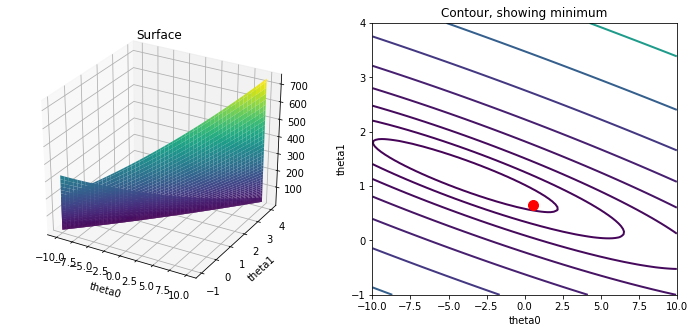

In [28]:
# grid over which we will calculate J
theta0_vals = np.linspace(-10, 10, 100)
theta1_vals = np.linspace(-1, 4, 100)

# initialize J_vals to a matrix of 0's
J_vals = np.zeros((theta0_vals.shape[0], theta1_vals.shape[0]))

# Fill out J_vals
for i, theta0 in enumerate(theta0_vals):
    for j, theta1 in enumerate(theta1_vals):
        J_vals[i, j] = computeCost(X, y, [theta0, theta1])
        
# Because of the way meshgrids work in the surf command, we need to
# transpose J_vals before calling surf, or else the axes will be flipped
J_vals = J_vals.T

# surface plot
fig = plt.figure(figsize=(12, 5))
ax = fig.add_subplot(121, projection='3d')
ax.plot_surface(theta0_vals, theta1_vals, J_vals, cmap='viridis')
plt.xlabel('theta0')
plt.ylabel('theta1')
plt.title('Surface')

# contour plot
# Plot J_vals as 15 contours spaced logarithmically between 0.01 and 100
ax = plt.subplot(122)
plt.contour(theta0_vals, theta1_vals, J_vals, linewidths=2, cmap='viridis', levels=np.logspace(-2, 3, 20))
plt.xlabel('theta0')
plt.ylabel('theta1')
plt.plot(theta[0], theta[1], 'ro', ms=10, lw=2)
plt.title('Contour, showing minimum')
pass